In [133]:
import numpy as np
from astropy.io import ascii
import matplotlib
import pylab as plt
from matplotlib.colors import LogNorm
import math as m
from scipy import stats
import pandas as pd
import matplotlib.gridspec as gridspec

from astropy.utils.data import download_file
from astropy.wcs import wcs
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
from astropy.coordinates import ICRS, Distance, Angle
from astropy import units as u
from numpy import loadtxt

# import pyneb as pn
# H1  = pn.RecAtom('H',1)
# He1 = pn.RecAtom('He',1)
# He2 = pn.RecAtom('He',2)
# O2  = pn.Atom('O',2)
# O3  = pn.Atom('O',3)

plt.rc('text',usetex=True)
fontsize=20
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

regions  = "regions.list"
contSub  = "contSub.list"
observed = "origSpec.list"
fitsFile = "fits.list"
refit = "refits.list"

BJDATA = {}
gdata = loadtxt(fitsFile, comments="#", dtype=str, unpack=False)
regionName = loadtxt(regions, comments="#", dtype=str, unpack=False)
contSubFileName = loadtxt(contSub, comments="#", dtype=str, unpack=False)
observedFileName = loadtxt(observed, comments="#", dtype=str, unpack=False)
refitFileName = loadtxt(refit, comments='#', dtype=str, unpack=False)
nn = len(gdata)

BJDATA['FHB']        = np.empty([nn])   # H-Beta flux
BJDATA['IH11']       = np.empty([nn])   # H11 line intensity (=I(H11)/I(H-Beta) = H11flux/HBflux
BJDATA['I_ERR']      = np.empty([nn])
BJDATA['IHB']        = np.empty([nn])   # H-Beta intensity: normalized to 1?
BJDATA['EHB']        = np.empty([nn])  
BJDATA['CHB']        = np.empty([nn])
BJDATA['CHBErr']     = np.empty([nn])
BJDATA['IHe3965']    = np.empty([nn])   # He+(3965) intensity = 3965flux/HBflux
BJDATA['IHe4387']    = np.empty([nn])   # He+(4387) intensity = 4387flux/HBflux 
BJDATA['IHe4921']    = np.empty([nn])   # He+(4921) intensity = 4921flux/HBflux
BJDATA['IHe5015']    = np.empty([nn])   # He+(5015) intensity = 5015flux/HBflux
BJDATA['IHe6678']    = np.empty([nn])   # He+(6678) intensity = 6678flux/HBflux
BJDATA['IHe7280']    = np.empty([nn])   # He+(7280) intensity = 7280flux/HBflux
BJDATA['IHe4686']    = np.empty([nn])   # He+(4686) intensity = 4686flux/HBflux
BJDATA['EHe3965']    = np.empty([nn])   # He+(3965) intensity = 3965flux/HBflux
BJDATA['EHe4387']    = np.empty([nn])   # He+(4387) intensity = 4387flux/HBflux 
BJDATA['EHe4921']    = np.empty([nn])   # He+(4921) intensity = 4921flux/HBflux
BJDATA['EHe5015']    = np.empty([nn])   # He+(5015) intensity = 5015flux/HBflux
BJDATA['EHe6678']    = np.empty([nn])   # He+(6678) intensity = 6678flux/HBflux
BJDATA['EHe7280']    = np.empty([nn])   # He+(7280) intensity = 7280flux/HBflux
BJDATA['EHe4686']    = np.empty([nn])   # He+(4686) intensity = 4686flux/HBflux
BJDATA['IO3727']     = np.empty([nn])
BJDATA['EO3727']     = np.empty([nn])
BJDATA['IO3729']     = np.empty([nn])
BJDATA['EO3729']     = np.empty([nn])
BJDATA['IO4959']     = np.empty([nn])
BJDATA['EO4959']     = np.empty([nn])
BJDATA['IO5007']     = np.empty([nn])
BJDATA['EO5007']     = np.empty([nn])
BJDATA['FLUX_H11']   = np.empty([nn])       
BJDATA['ERR_H11']    = np.empty([nn])
BJDATA['FLUX_HB']    = np.empty([nn])
BJDATA['ERR_HB']     = np.empty([nn])
BJDATA['T_OIII']     = np.empty([nn])
BJDATA['T_NII']      = np.empty([nn])
BJDATA['T_SIII']     = np.empty([nn])
BJDATA['T_OIII_UNC'] = np.empty([nn])
BJDATA['T_NII_UNC']  = np.empty([nn])
BJDATA['T_SIII_UNC'] = np.empty([nn])
BJDATA['T_OIII_USED']= np.empty([nn])
BJDATA['T_NII_USED'] = np.empty([nn])
BJDATA['T_OIII_USED_UNC'] = np.empty([nn])
BJDATA['T_NII_USED_UNC']  = np.empty([nn])
BJDATA['T_SIII_USED']     = np.empty([nn])
BJDATA['T_SIII_USED_UNC'] = np.empty([nn])
BJDATA['Blue'] = np.empty([nn])
BJDATA['BlueErr'] = np.empty([nn])
BJDATA['Red1'] = np.empty([nn])
BJDATA['Red1Err'] = np.empty([nn])
BJDATA['Red2'] = np.empty([nn])
BJDATA['Red2Err'] = np.empty([nn])
BJDATA['Red3'] = np.empty([nn])
BJDATA['Red3Err'] = np.empty([nn])
BJDATA['Red4'] = np.empty([nn])
BJDATA['Red4Err'] = np.empty([nn])
BJDATA['Red'] = np.empty([nn])
BJDATA['RedErr'] = np.empty([nn])
BJDATA['Jump'] = np.empty([nn])
BJDATA['JumpErr'] = np.empty([nn])
BJDATA['JumpContrast'] = np.empty([nn])
BJDATA['RatioH11'] = np.empty([nn])
BJDATA['RatioH11Corr'] = np.empty([nn])
BJDATA['T(Bac)H11'] = np.empty([nn])
BJDATA['T(Bac)H11Err'] = np.empty([nn])
BJDATA['RatioHBeta'] = np.empty([nn])
BJDATA['RatioHBetaCorr'] = np.empty([nn])
BJDATA['T(Bac)HBeta'] = np.empty([nn])
BJDATA['T(Bac)HBetaErr'] = np.empty([nn])
BJDATA['TOIII']     = np.empty([nn])         #Final T arrays 
BJDATA['TNII']      = np.empty([nn])
BJDATA['TSIII']     = np.empty([nn])
BJDATA['TOIIIErr'] = np.empty([nn])
BJDATA['TNIIErr']  = np.empty([nn])
BJDATA['TSIIIErr'] = np.empty([nn])
BJDATA['OA']     = np.empty([nn])
BJDATA['OAE'] = np.empty([nn])
BJDATA['LOH']  = np.empty([nn])
BJDATA['LOHE'] = np.empty([nn])
BJDATA['Region'] = ["" for x in range(0,nn)]
BJDATA['H11HBObs'] = np.empty([nn])
BJDATA['H11HBCorr'] = np.empty([nn])
BJDATA['T(bac)H11Model'] = np.empty([nn])
BJDATA['T(bac)H11ModelErr'] = np.empty([nn])



for i in range(0,nn):
    reg       = fits.open(gdata[i])         # opens fits file
    lines     = reg[1].data                 # fits file data access
    flux      = reg[3].data
    #print(reg[3].columns)
    temden    = reg[4].data

    H11    = (lines['WAVELENGTH'] == 3770.633)      # returns array of false, with true where 
    HB     = (lines['WAVELENGTH'] == 4861.3500)     # specific wavelength is found
    He3965 = (lines['WAVELENGTH'] == 3964.7291)
    He4387 = (lines['WAVELENGTH'] == 4387.9300)
    He4921 = (lines['WAVELENGTH'] == 4921.9310)
    He5015 = (lines['WAVELENGTH'] == 5015.6780)
    He6678 = (lines['WAVELENGTH'] == 6678.1510)
    He7280 = (lines['WAVELENGTH'] == 7281.3490)
    He4686 = (lines['WAVELENGTH'] == 4685.7030)
    O3727  = (lines['WAVELENGTH'] == 3726.0400)
    O3729  = (lines['WAVELENGTH'] == 3728.8000)
    O4959  = (lines['WAVELENGTH'] == 4958.9110)
    O5007  = (lines['WAVELENGTH'] == 5006.8430)


    BJDATA['FHB'][i]     = flux['F_CORR' ][HB]        # Falses do not give a value
    BJDATA['IH11'][i]    = flux['I_HBETA'][H11]       # entries where true will populate 
    BJDATA['I_ERR'][i]   = flux['I_ERR'  ][HB]          
    BJDATA['IHB'][i]     = flux['I_HBETA'][HB]        # a single value
    BJDATA['CHB'][i]     = flux['CHBETA' ][HB] 
    BJDATA['CHBErr'][i]  = flux['CHBETA_UNC' ][HB]
    BJDATA['IHe3965'][i] = flux['I_HBETA'][He3965]
    BJDATA['IHe4387'][i] = flux['I_HBETA'][He4387]
    BJDATA['IHe4921'][i] = flux['I_HBETA'][He4921]
    BJDATA['IHe5015'][i] = flux['I_HBETA'][He5015]
    BJDATA['IHe6678'][i] = flux['I_HBETA'][He6678]
    BJDATA['IHe7280'][i] = flux['I_HBETA'][He7280]
    BJDATA['IHe4686'][i] = flux['I_HBETA'][He4686]
    BJDATA['FLUX_H11'][i]= lines['Flux'  ][H11]      
    BJDATA['ERR_H11'][i] = lines['F_unc' ][H11]
    BJDATA['FLUX_HB'][i] = lines['Flux'  ][HB]
    BJDATA['ERR_HB'] [i] = lines['F_unc' ][HB]

    BJDATA['IHB'][i],    BJDATA['EHB'][i]     = flux['I_HBETA'][HB],     flux['I_ERR'][HB]
    BJDATA['IHe3965'][i],BJDATA['EHe3965'][i] = flux['I_HBETA'][He3965], flux['I_ERR'][He3965] 
    BJDATA['IHe4387'][i],BJDATA['EHe4387'][i] = flux['I_HBETA'][He4387], flux['I_ERR'][He4387]
    BJDATA['IHe4921'][i],BJDATA['EHe4921'][i] = flux['I_HBETA'][He4921], flux['I_ERR'][He4921]
    BJDATA['IHe5015'][i],BJDATA['EHe5015'][i] = flux['I_HBETA'][He5015], flux['I_ERR'][He5015]
    BJDATA['IHe6678'][i],BJDATA['EHe6678'][i] = flux['I_HBETA'][He6678], flux['I_ERR'][He6678]
    BJDATA['IHe7280'][i],BJDATA['EHe7280'][i] = flux['I_HBETA'][He7280], flux['I_ERR'][He7280]
    BJDATA['IHe4686'][i],BJDATA['EHe4686'][i] = flux['I_HBETA'][He4686], flux['I_ERR'][He4686]
    BJDATA['IO3727'][i], BJDATA['EO3727'][i]  = flux['I_HBETA'][O3727],  flux['I_ERR'][O3727]
    BJDATA['IO3729'][i], BJDATA['EO3729'][i]  = flux['I_HBETA'][O3729],  flux['I_ERR'][O3729]
    BJDATA['IO4959'][i], BJDATA['EO4959'][i]  = flux['I_HBETA'][O4959],  flux['I_ERR'][O4959]
    BJDATA['IO5007'][i], BJDATA['EO5007'][i]  = flux['I_HBETA'][O5007],  flux['I_ERR'][O5007]

    O2sig   = ((BJDATA['IO3727'][i]+BJDATA['IO3729'][i]) > 3.0*(BJDATA['EO3727'][i]+BJDATA['EO3729'][i])) 
    O3sig   = ((BJDATA['IO4959'][i]+BJDATA['IO5007'][i]) > 3.0*(BJDATA['EO4959'][i]+BJDATA['EO5007'][i])) 

    to3   = (temden['ION']  == '[O III]')
    tn2   = (temden['ION']  == '[N II]')
    ts3   = (temden['ION']  == '[S III]')
    TO3   = temden['T_OIII'][to3]
    TN2   = temden['T_OII'] [tn2]
    TS3   = temden['T_SIII'][ts3]
    TO3E  = temden['T_OIII_UNC'][to3]
    TN2E  = temden['T_OII_UNC'] [tn2]
    TS3E  = temden['T_SIII_UNC'][ts3]
    TO3E  = np.where(TO3E > 0., TO3E, 1.0E10)
    TN2E  = np.where(TN2E > 0., TN2E, 1.0E10)
    TS3E  = np.where(TS3E > 0., TS3E, 1.0E10)
    tused = (temden['ION']  == 'FINAL')
    #den   = temden['DENS'][tused]
    #dene  = temden['DENS_UNC'][tused]
    den = 100

    BJDATA['T_OIII'][i] = temden['T_OIII'][to3]
    BJDATA['T_NII'][i] = temden['T_OII'] [tn2]
    BJDATA['T_SIII'][i] = temden['T_SIII'][ts3]
    BJDATA['T_OIII_UNC'][i] = temden['T_OIII_UNC'][to3]
    BJDATA['T_NII_UNC'][i] = temden['T_OII_UNC'] [tn2]
    BJDATA['T_SIII_UNC'][i] = temden['T_SIII_UNC'][ts3]

    BJDATA['T_OIII_USED'][i] = temden['T_OIII'][tused]
    BJDATA['T_NII_USED'][i] = temden['T_OII'][tused]
    BJDATA['T_OIII_USED_UNC'][i] = temden['T_OIII_UNC'][tused]
    BJDATA['T_NII_USED_UNC'][i] = temden['T_OII_UNC'][tused]
    BJDATA['T_SIII_USED'][i] = temden['T_SIII'][tused]
    BJDATA['T_SIII_USED_UNC'][i] = temden['T_SIII_UNC'][tused]

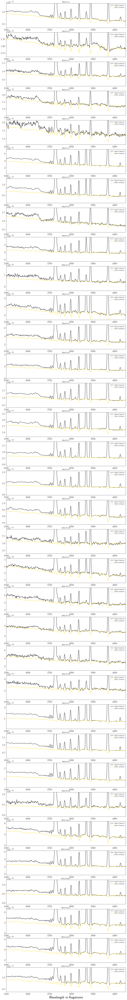

In [134]:
# Checking Continuum Fits

plt.figure(figsize=(16,4*nn))

for i in range(0,nn):
    Region = regionName[i]
    BJDATA['Region'][i] = Region
    ContSubFile = contSubFileName[i]
    ObservedFile = observedFileName[i] 
    refitFile = refitFileName[i]

    wavelengthCS, contSubFlux = np.loadtxt(ContSubFile, unpack=True, usecols=(0,1))
    wavelengthObs, flux, err = np.loadtxt(ObservedFile, unpack=True, usecols=(0,1,2))
    wavelengthRF, fluxRF, errRF, contRF = np.loadtxt(refitFile, unpack=True, usecols=(0,1,2,3))

    if len(flux) > len(contSubFlux):
        flux = flux[400:400+len(contSubFlux)]
    wavelength = wavelengthCS[0:len(contSubFlux)]

    stellarContinuum = flux - contSubFlux

    wmin = wavelength[0]
    wmax = 3900
    wave = np.array(wavelength)
    f = np.array(flux)
    vals = (wave > 3765) & (wave < 3775)
    ymax = np.max(f[(vals)])
    ymin = stellarContinuum[270]
    delta = ymax - ymin
    ymax = ymax + delta
    ymin = ymin - delta
    
    plt.subplot(nn,1,i+1)
    plt.title(Region)
    plt.axis([3500, 4050,ymin,ymax])
#    plt.plot(wavelength,contSubFlux,color='purple', label = 'Continuum Subtracted')
    plt.plot(wavelength,flux,color='black', label='Original Spectrum')
    plt.plot(wavelengthRF,contRF,color='gold', label='Stellar Continuum')
    if i == nn-1: plt.xlabel("Wavelength in Angstroms")
    #plt.ylabel("Flux in erg/s*cm^2*Ang") 
    plt.legend(loc = 'best')
    
plt.savefig('ContinuumRefits.png')    

In [135]:
blueBoxesAll = np.full((nn, 6), 1, dtype=int)

#Flags: 0 is not used in good set. 1 is used in good set. 9 is investigate.

blueBoxesGood = np.array([(1,1,1,1,1,1),   #F1_4
                         (1,1,1,1,1,1),        #F1_9
                         (1,1,1,0,1,1),        #F2_3
                         (1,1,1,0,0,1),        #F2_6
                         (0,1,0,1,1,1),        #F2_7
                         (0,1,0,1,0,1),        #F3_1
                         (1,0,1,1,0,1),        #F3_3
                         (1,1,1,1,1,1),        #F3-6
                         (0,1,1,1,0,1),        #F3-9
                         (1,1,1,1,1,1),        #F3_11
                          (1,1,1,1,1,1),    #F4-1
                         (1,1,1,1,0,1),        #F4_3
                          (1,1,1,1,1,1),    #F4-4
                            (1,1,1,1,1,1),    #F4-5
                         (1,1,1,0,1,1),        #F4_6
                          (1,1,1,1,1,1),    #F4-7
                         (1,1,1,1,1,1),        #F4_8
                         (0,0,1,0,0,1),        #F4_9
                          (1,1,1,1,1,1),    #F4-18
                          (1,1,1,1,1,1),    #F5-1
                            (1,1,1,1,1,1),    #F5-11
                         (1,1,0,0,1,1),        #F5_12
                          (1,1,1,1,1,1),    #F5-13
                            (1,1,1,1,1,1),    #F5-20
                         (1,1,1,1,1,1),        #F6_1
                          (1,1,1,1,1,1),    #F6-2
                            (1,1,1,1,1,1),    #F6-3
                            (1,1,1,1,1,1),    #F6-22
                            (1,1,1,1,1,1),    #LS1a-2
                         (1,1,1,1,1,1),         #LS1b_1
                         #,(1,1,1,1,1,1),       #LS1b_2
                          (1,1,1,1,1,1),    #LS1b-3
                            (1,1,1,1,1,1),    #LS1c-1
                            (1,1,1,1,1,1),    #LS1c-2
                            (1,1,1,1,1,1),    #LS1c-3
                           # (1,1,1,1,1,1),    #LS2a-1
                           # (1,1,1,1,1,1),    #LS2a-2&3
                           #(1,1,1,1,1,1)
                             ])     

                            


flags = np.array([1,0,0,0,0,1,1,0,1,0,0,1,1,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,1,1,1,1,1])

blueBoxes = [(3500,3515),
             (3516,3550),
             (3551,3582),
             (3593,3608),
             (3619,3629),
             (3638,3646)]

redBoxes3930 = [(3757,3764),
           (3778,3792),
           (3805,3813),
           (3826,3829),
           (3843,3858),
           (3877,3881),
           (3898,3930)]

redBoxes3900 = [(3757,3764),
           (3778,3792),
           (3805,3813),
           (3826,3829),
           (3843,3858),
           (3877,3881),
           (3898,3900)]


In [136]:
#Chosen Blue Line Fits & red line methods


counter3930 = 0
for box in redBoxes3930:
    counter3930+=box[1]-box[0]+1

counter3900 = 0
for box in redBoxes3900:
    counter3900+=box[1]-box[0]+1

plt.figure(figsize=(40,16*nn))

for i in range(0,nn):
    Region = regionName[i]
    ContSubFile = contSubFileName[i]
    ObservedFile = observedFileName[i]   
    refitFile = refitFileName[i]

    wavelengthCS, contSubFlux = np.loadtxt(ContSubFile, unpack=True, usecols=(0,1))
    wavelengthObs, flux, err = np.loadtxt(ObservedFile, unpack=True, usecols=(0,1,2))
    wavelengthRF, fluxRF, errRF, contRF = np.loadtxt(refitFile, unpack=True, usecols=(0,1,2,3))


    if len(flux) > len(contSubFlux):
        flux = flux[400:400+len(contSubFlux)]
        err = err[400:400+len(contSubFlux)]
    wavelength = wavelengthCS[0:400+len(contSubFlux)]

    stellarContinuum = flux - contSubFlux
    
    blueMeasurementsAll = []

    MCFAll = 0

    bwAll = []
    bfAll = []
    beAll = []
        
    counterAll = 0
    boxiAll = 0
    for box in blueBoxes:
        istartAll = wavelength.tolist().index(box[0])
        iendAll = wavelength.tolist().index(box[1])+1
        counterAll+=box[1]-box[0]+1  
        for k in range(istartAll,iendAll):
            bwAll.append(wavelength[k])
            bfAll.append(flux[k])
            beAll.append(err[k])
        boxiAll = boxiAll+1

    blueWavelengthAll = np.array(bwAll)
    blueFluxAll = np.array(bfAll)
    blueSigmaAll = np.array(beAll)

    for j in range(1000):
        MCFluxAll = []

        for n in range(len(blueFluxAll)):
            MCFAll = blueFluxAll[n]+(blueSigmaAll[n]*np.random.normal(loc=0.0, scale=1.0, size=None))
            MCFluxAll.append(MCFAll)


        blueSideAll = np.empty(counterAll)

        for k in range(len(MCFluxAll)):
            blueSideAll[k] = MCFluxAll[k]

        softBlueSideAll = blueSideAll

        slopeAll, interceptAll, r_value, p_value, std_err = stats.linregress(blueWavelengthAll, blueSideAll)

        blueFirstFitAll = slopeAll*blueWavelengthAll+interceptAll

        varAll = np.var(blueFirstFitAll[0:146])
        sigmaBlueAll = varAll**(1/2)

        for k in range(len(blueSideAll)):
            if np.abs(blueSideAll[k]-blueFirstFitAll[k]) > (2*sigmaBlueAll):
                softBlueSideAll[k] = blueFirstFitAll[k]
            else:
                softBlueSideAll[k] = blueSideAll[k]                             

        slopeAll, interceptAll, r_value, p_value, std_err = stats.linregress(blueWavelengthAll, softBlueSideAll)

        blueFitLineAll = slopeAll*wavelength[0:146]+interceptAll

        blueMeasurementsAll.append(blueFitLineAll[-4])
        
    blueMeasurementsGood = []

    MCFGood = 0

    bwGood = []
    bfGood = []
    beGood = []
        
    counterGood = 0
    boxiGood = 0
    for box in blueBoxes:
        istartGood = wavelength.tolist().index(box[0])
        iendGood = wavelength.tolist().index(box[1])+1
        if (blueBoxesGood[i,boxiGood] > 0):
            counterGood+=box[1]-box[0]+1  
            for k in range(istartGood,iendGood):
                bwGood.append(wavelength[k])
                bfGood.append(flux[k])
                beGood.append(err[k])
        boxiGood = boxiGood+1

    blueWavelengthGood = np.array(bwGood)
    blueFluxGood = np.array(bfGood)
    blueSigmaGood = np.array(beGood)

    for j in range(1000):
        MCFluxGood = []

        for n in range(len(blueFluxGood)):
            MCFGood = blueFluxGood[n]+(blueSigmaGood[n]*np.random.normal(loc=0.0, scale=1.0, size=None))
            MCFluxGood.append(MCFGood)


        blueSideGood = np.empty(counterGood)

        for k in range(len(MCFluxGood)):
            blueSideGood[k] = MCFluxGood[k]

        softBlueSideGood = blueSideGood

        slopeGood, interceptGood, r_value, p_value, std_err = stats.linregress(blueWavelengthGood, blueSideGood)

        blueFirstFitGood = slopeGood*blueWavelengthGood+interceptGood

        varGood = np.var(blueFirstFitGood[0:146])
        sigmaBlueGood = varGood**(1/2)

        for k in range(len(blueSideGood)):
            if np.abs(blueSideGood[k]-blueFirstFitGood[k]) > (2*sigmaBlueGood):
                softBlueSideGood[k] = blueFirstFitGood[k]
            else:
                softBlueSideGood[k] = blueSideGood[k]                             

        slopeGood, interceptGood, r_value, p_value, std_err = stats.linregress(blueWavelengthGood, softBlueSideGood)

        blueFitLineGood = slopeGood*wavelength[0:146]+interceptGood

        blueMeasurementsGood.append(blueFitLineGood[-4])
        

    redMeasurementsCont3930 = []
    redMeasurementsCont3900 = []
    redMeasurementsFlux3930 = []
    redMeasurementsFlux3900 = []

    redMCC3930 = 0
    redMCC3900 = 0
    redMCF3930 = 0
    redMCF3900 = 0

    rw3930 = []
    rc3930 = []
    rf3930 = []
    re3930 = []
    rw3900 = []
    rc3900 = []
    rf3900 = []
    re3900 = []

    for box in redBoxes3930:
        istart3930 = wavelength.tolist().index(box[0])
        iend3930 = wavelength.tolist().index(box[1])+1
        for k in range(istart3930,iend3930):
            rw3930.append(wavelength[k])
            rc3930.append(contRF[k])
            rf3930.append(fluxRF[k])
            re3930.append(err[k])

    redWavelength3930 = np.array(rw3930)
    redContinuum3930 = np.array(rc3930)
    redFlux3930 = np.array(rf3930)
    redSigma3930 = np.array(re3930)
    
    for box in redBoxes3900:
        istart3900 = wavelength.tolist().index(box[0])
        iend3900 = wavelength.tolist().index(box[1])+1
        for k in range(istart3900,iend3900):
            rw3900.append(wavelength[k])
            rc3900.append(contRF[k])
            rf3900.append(fluxRF[k])
            re3900.append(err[k])

    redWavelength3900 = np.array(rw3900)
    redContinuum3900 = np.array(rc3900)
    redFlux3900 = np.array(rf3900)
    redSigma3900 = np.array(re3900)    

    for j in range(1000):
        redMCCont3930 = []
        redMCCont3900 = []
        redMCFlux3930 = []
        redMCFlux3900 = []


        for k in range(len(redWavelength3930)):
                redMCC3930 = redContinuum3930[k]+(redSigma3930[k]*np.random.normal(loc=0.0, scale=1.0, size=None))
                redMCCont3930.append(redMCC3930)
                redMCF3930 = redFlux3930[k]+(redSigma3930[k]*np.random.normal(loc=0.0, scale=1.0, size=None))
                redMCFlux3930.append(redMCF3930)

        for k in range(len(redWavelength3900)):
                redMCC3900 = redContinuum3900[k]+(redSigma3900[k]*np.random.normal(loc=0.0, scale=1.0, size=None))
                redMCCont3900.append(redMCC3900)
                redMCF3900 = redFlux3900[k]+(redSigma3900[k]*np.random.normal(loc=0.0, scale=1.0, size=None))
                redMCFlux3900.append(redMCF3900)
                
        redSideCont3930 = np.empty(counter3930)
        redSideCont3900 = np.empty(counter3900)
        redSideFlux3930 = np.empty(counter3930)
        redSideFlux3900 = np.empty(counter3900)


        for k in range(len(redWavelength3930)):
                redSideCont3930[k] = redMCCont3930[k]
                redSideFlux3930[k] = redMCFlux3930[k]
        for k in range(len(redWavelength3900)):
                redSideCont3900[k] = redMCCont3900[k]
                redSideFlux3900[k] = redMCFlux3900[k]

        softRedSideCont3930 = redSideCont3930
        softRedSideCont3900 = redSideCont3900
        softRedSideFlux3930 = redSideFlux3930
        softRedSideFlux3900 = redSideFlux3900

        slopeCont3930, interceptCont3930, r_value, p_value, std_err = stats.linregress(redWavelength3930, redSideCont3930)
        slopeCont3900, interceptCont3900, r_value, p_value, std_err = stats.linregress(redWavelength3900, redSideCont3900)
        slopeFlux3930, interceptFlux3930, r_value, p_value, std_err = stats.linregress(redWavelength3930, redSideFlux3930)
        slopeFlux3900, interceptFlux3900, r_value, p_value, std_err = stats.linregress(redWavelength3900, redSideFlux3900)

        redFirstFitCont3930 = slopeCont3930*redWavelength3930+interceptCont3930
        redFirstFitCont3900 = slopeCont3900*redWavelength3900+interceptCont3900
        redFirstFitFlux3930 = slopeFlux3930*redWavelength3930+interceptFlux3930
        redFirstFitFlux3900 = slopeFlux3900*redWavelength3900+interceptFlux3900

        varCont3930 = np.var(redFirstFitCont3930)
        sigmaCont3930 = varCont3930**(1/2)
        varCont3900 = np.var(redFirstFitCont3900)
        sigmaCont3900 = varCont3900**(1/2)
        varFlux3930 = np.var(redFirstFitFlux3930)
        sigmaFlux3930 = varFlux3930**(1/2)
        varFlux3900 = np.var(redFirstFitFlux3900)
        sigmaFlux3900 = varFlux3900**(1/2)

        for k in range(len(redSideCont3930)):
            if np.abs(redSideCont3930[k]-redFirstFitCont3930[k]) > (2*sigmaCont3930):
                softRedSideCont3930[k] = redFirstFitCont3930[k]
            else:
                softRedSideCont3930[k] = redSideCont3930[k]
                
        for k in range(len(redSideCont3900)):
            if np.abs(redSideCont3900[k]-redFirstFitCont3900[k]) > (2*sigmaCont3900):
                softRedSideCont3900[k] = redFirstFitCont3900[k]
            else:
                softRedSideCont3900[k] = redSideCont3900[k]
                
        for k in range(len(redSideFlux3930)):
            if np.abs(redSideFlux3930[k]-redFirstFitFlux3930[k]) > (2*sigmaFlux3930):
                softRedSideFlux3930[k] = redFirstFitFlux3930[k]
            else:
                softRedSideFlux3930[k] = redSideFlux3930[k]
                
        for k in range(len(redSideFlux3900)):
            if np.abs(redSideFlux3900[k]-redFirstFitFlux3900[k]) > (2*sigmaFlux3900):
                softRedSideFlux3900[k] = redFirstFitFlux3900[k]
            else:
                softRedSideFlux3900[k] = redSideFlux3900[k]

        slopeCont3930, interceptCont3930, r_value, p_value, std_err = stats.linregress(redWavelength3930, softRedSideCont3930)
        slopeCont3900, interceptCont3900, r_value, p_value, std_err = stats.linregress(redWavelength3900, softRedSideCont3900)
        slopeFlux3930, interceptFlux3930, r_value, p_value, std_err = stats.linregress(redWavelength3930, softRedSideFlux3930)
        slopeFlux3900, interceptFlux3900, r_value, p_value, std_err = stats.linregress(redWavelength3900, softRedSideFlux3900)

        redFitLineCont3930 = slopeCont3930*wavelength+interceptCont3930
        redFitLineCont3900 = slopeCont3900*wavelength+interceptCont3900
        redFitLineFlux3930 = slopeFlux3930*wavelength+interceptFlux3930
        redFitLineFlux3900 = slopeFlux3900*wavelength+interceptFlux3900
        
        redMeasurementsCont3930.append(redFitLineCont3930[181])
        redMeasurementsCont3900.append(redFitLineCont3900[181])
        redMeasurementsFlux3930.append(redFitLineFlux3930[181])
        redMeasurementsFlux3900.append(redFitLineFlux3900[181])

    wmin = wavelength[0]
    wmax = 3900
    wave = np.array(wavelength)
    f = np.array(flux)
    vals = (wave > 3765) & (wave < 3775)
    ymax = np.max(f[(vals)])
    ymin = contRF[270]
    delta = ymax - ymin
    ymax = ymax + delta
    ymin = ymin - delta
    
    BJDATA['Blue'][i]          = np.average(blueMeasurementsGood)
    BJDATA['Red1'][i]          = np.average(redMeasurementsCont3930)
    BJDATA['Red2'][i]          = np.average(redMeasurementsCont3900)
    BJDATA['Red3'][i]          = np.average(redMeasurementsFlux3930)
    BJDATA['Red4'][i]          = np.average(redMeasurementsFlux3900)
    BJDATA['BlueErr'][i]       = np.std(blueMeasurementsGood)
    BJDATA['Red1Err'][i]       = np.std(redMeasurementsCont3930)
    BJDATA['Red2Err'][i]       = np.std(redMeasurementsCont3900)
    BJDATA['Red3Err'][i]       = np.std(redMeasurementsFlux3930)
    BJDATA['Red4Err'][i]       = np.std(redMeasurementsFlux3900)

    
    
   #plt.subplot(gs[i,0])
    plt.subplot(nn*3,2,6*i+1)
    if i == 0: plt.title('Blue Continuum Selection Windows')
    plt.axis([3499, 3650,ymin,ymax])
    plt.plot(wavelength,flux,color='black', label = 'Observed Spectrum')
    plt.plot(wavelength[0:146],blueFitLineAll[0:146],color='blue', label = 'Blue Fit Line')
    #plt.xlabel("Wavelength in Angstroms")
    #plt.ylabel("Flux in erg/s*cm^2*Ang") 
    plt.plot((3646.00, 3646.00),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3587.00, 3587.00),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3613.60, 3613.60),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3634.24, 3634.24),(ymin, ymax), "black", alpha = 0.5)
    boxi1 = 0
    for box in blueBoxes:
        plt.axvspan(box[0], box[1], alpha=0.3, color='blue')   
        boxiAll = boxiAll + 1    
    plt.legend(loc = 'best')

    #plt.subplot(gs[i,1])
    plt.subplot(nn*3,2,6*i+2)
    if i == 0: plt.title('Chosen Blue Selection Windows')
    plt.title('Blue Fit Line')
    plt.axis([3499, 3650,ymin,ymax])
    plt.plot(wavelength,flux,color='black', label = 'Observed Spectrum')
    plt.plot(wavelength[0:146],blueFitLineGood[0:146],color='blue', label = 'Blue Fit Line')
    plt.plot((3646.00, 3646.00),(ymin, ymax), "black", alpha = 0.3)
    plt.plot((3587.00, 3587.00),(ymin, ymax), "black", alpha = 0.3)
    plt.plot((3613.60, 3613.60),(ymin, ymax), "black", alpha = 0.3)
    plt.plot((3634.24, 3634.24),(ymin, ymax), "black", alpha = 0.3)
    boxiGood = 0
    for box in blueBoxes:
        if (blueBoxesGood[i,boxiGood] > 0):
            plt.axvspan(box[0], box[1], alpha=0.3, color='blue')   
        boxiGood = boxiGood + 1 
    plt.legend(loc = 'best')
   
    plt.subplot(nn*3,2,6*i+3)
    plt.title('Continuum Selection Windows - 3930')
    plt.axis([3600, 3930,ymin,ymax])
    plt.plot(wavelength,flux,color='black', label = 'Observed Spectrum')
    plt.plot(wavelengthRF,contRF,color='gold', label = 'Stellar Continuum')
    plt.plot(wavelength[0:146],blueFitLineGood[0:146],color='blue', label = 'Blue Fit Line')
    plt.plot(wavelength[147:1147],redFitLineCont3930[147:1147],color='red', label = 'Red Fit Line') 
    plt.plot((3646.00, 3646.00),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3770.63, 3770.63),(ymin, ymax), "black", alpha = 0.5) 
    plt.plot((3797.90, 3797.90),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3819.61, 3819.61),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3835.39, 3835.39),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3868.75, 3868.75),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3889.05, 3889.05),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3587.00, 3587.00),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3613.60, 3613.60),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3634.24, 3634.24),(ymin, ymax), "green", alpha = 0.5)
    for box in redBoxes3930:
        plt.axvspan(box[0], box[1], alpha=0.3, color='red')
    boxiGood = 0
    for box in blueBoxes:
        if (blueBoxesGood[i,boxiGood] > 0):
            plt.axvspan(box[0], box[1], alpha=0.3, color='blue')   
        boxiGood = boxiGood + 1    
    plt.legend(loc = 'best')

    plt.subplot(nn*3, 2,6*i+4)
    plt.title('Continuum Selection Windows - 3900')
    plt.axis([3600, 3930,ymin,ymax])
    plt.plot(wavelength,flux,color='black', label = 'Observed Spectrum')
    plt.plot(wavelengthRF,contRF,color='gold', label = 'Stellar Continuum')
    plt.plot(wavelength[0:146],blueFitLineGood[0:146],color='blue', label = 'Blue Fit Line')
    plt.plot(wavelength[147:1147],redFitLineCont3900[147:1147],color='red', label = 'Red Fit Line') 
    plt.plot((3646.00, 3646.00),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3770.63, 3770.63),(ymin, ymax), "black", alpha = 0.5) 
    plt.plot((3797.90, 3797.90),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3819.61, 3819.61),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3835.39, 3835.39),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3868.75, 3868.75),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3889.05, 3889.05),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3587.00, 3587.00),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3613.60, 3613.60),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3634.24, 3634.24),(ymin, ymax), "green", alpha = 0.5)
    plt.text(3950,(ymax+ymin)/2, Region, fontsize=26,color='k',rotation=-90,va='center')
    for box in redBoxes3900:
        plt.axvspan(box[0], box[1], alpha=0.3, color='red')
    boxiGood = 0
    for box in blueBoxes:
        if (blueBoxesGood[i,boxiGood] > 0):
            plt.axvspan(box[0], box[1], alpha=0.3, color='blue')   
        boxiGood = boxiGood + 1    
    plt.legend(loc = 'best')

    plt.subplot(nn*3,2,6*i+5)
    plt.title('Observed Flux Selection Windows - 3930')
    plt.axis([3600, 3930,ymin,ymax])
    plt.plot(wavelength,flux,color='black', label = 'Observed Spectrum')
    plt.plot(wavelengthRF,contRF,color='gold', label = 'Stellar Continuum')
    plt.plot(wavelength[0:146],blueFitLineGood[0:146],color='blue', label = 'Blue Fit Line')
    plt.plot(wavelength[147:1147],redFitLineFlux3930[147:1147],color='red', label = 'Red Fit Line') 
    plt.plot((3646.00, 3646.00),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3770.63, 3770.63),(ymin, ymax), "black", alpha = 0.5) 
    plt.plot((3797.90, 3797.90),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3819.61, 3819.61),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3835.39, 3835.39),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3868.75, 3868.75),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3889.05, 3889.05),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3587.00, 3587.00),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3613.60, 3613.60),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3634.24, 3634.24),(ymin, ymax), "green", alpha = 0.5)
    for box in redBoxes3930:
        plt.axvspan(box[0], box[1], alpha=0.3, color='red')
    boxiGood = 0
    for box in blueBoxes:
        if (blueBoxesGood[i,boxiGood] > 0):
            plt.axvspan(box[0], box[1], alpha=0.3, color='blue')   
        boxiGood = boxiGood + 1    
    plt.legend(loc = 'best')
    
    plt.subplot(nn*3,2,6*i+6)
    plt.title('Observed Flux Selection Windows - 3900')
    plt.axis([3600, 3930,ymin,ymax])
    plt.plot(wavelength,flux,color='black', label = 'Observed Spectrum')
    plt.plot(wavelengthRF,contRF,color='gold', label = 'Stellar Continuum')
    plt.plot(wavelength[0:146],blueFitLineGood[0:146],color='blue', label = 'Blue Fit Line')
    plt.plot(wavelength[147:1147],redFitLineFlux3900[147:1147],color='red', label = 'Red Fit Line') 
    plt.plot((3646.00, 3646.00),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3770.63, 3770.63),(ymin, ymax), "black", alpha = 0.5) 
    plt.plot((3797.90, 3797.90),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3819.61, 3819.61),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3835.39, 3835.39),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3868.75, 3868.75),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3889.05, 3889.05),(ymin, ymax), "black", alpha = 0.5)
    plt.plot((3587.00, 3587.00),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3613.60, 3613.60),(ymin, ymax), "green", alpha = 0.5)
    plt.plot((3634.24, 3634.24),(ymin, ymax), "green", alpha = 0.5)
    for box in redBoxes3900:
        plt.axvspan(box[0], box[1], alpha=0.3, color='red')
    boxiGood = 0
    for box in blueBoxes:
        if (blueBoxesGood[i,boxiGood] > 0):
            plt.axvspan(box[0], box[1], alpha=0.3, color='blue')   
        boxiGood = boxiGood + 1    
    plt.legend(loc = 'best')      
    
plt.savefig('LineFits.png')  
plt.savefig('LineFits.pdf')            

In [171]:
RedMethodArray = np.array([1,     #F1_4
                           1,     #F1_9
                           1,     #F2_3
                           1,     #F2_6
                           1,     #F2_7
                           1,     #F3_1
                           1,     #F3_3
                           3,     #F3_6
                           1,     #F3_9
                           2,     #F3_11
                           3,     #F4_1
                           1,     #F4_3
                           3,     #F4_4
                           1,     #F4_5
                           1,     #F4_6
                           1,     #F4_7
                           1,     #F4_8
                           1,     #F4_9
                           1,     #F4_18
                           3,     #F5_1
                           1,     #F5_11
                           1,     #F5_12
                           3,     #F5_13
                           1,     #F5_20   
                           1,     #F6_1
                           3,     #F6_2
                           3,     #F6_3
                           1,     #F6_22
                           3,     #LS1a_2
                           1,     #LS1b_1
                         #  1,     #LS1b_2
                           3,     #LS1b_3
                           3,     #LS1c_1
                           1,     #LS1c_2
                           3     #LS1c_3
                         #  1,     #LS2a_1
                         #  1,     #LS2a_3
                         #  1     #LS3_6
                             ])


for i in range(0,nn):
    if RedMethodArray[i] == 1:
        BJDATA['Red'][i] = BJDATA['Red1'][i]
        BJDATA['RedErr'][i]  = BJDATA['Red1Err'][i]
    elif RedMethodArray[i] == 2:    
        BJDATA['Red'][i] = BJDATA['Red2'][i]
        BJDATA['RedErr'][i]  = BJDATA['Red2Err'][i]
    elif RedMethodArray[i] == 3:    
        BJDATA['Red'][i] = BJDATA['Red3'][i]
        BJDATA['RedErr'][i]  = BJDATA['Red3Err'][i]
    elif RedMethodArray[i] == 4:    
        BJDATA['Red'][i] = BJDATA['Red4'][i]
        BJDATA['RedErr'][i]  = BJDATA['Red4Err'][i]

    BJDATA['Jump'][i]         = BJDATA['Blue'][i]-BJDATA['Red'][i] 
    BJDATA['JumpErr'][i]      = (BJDATA['BlueErr'][i]**2+BJDATA['RedErr'][i]**2)**0.5
    BJDATA['JumpContrast'][i] = BJDATA['Jump'][i]/BJDATA['JumpErr'][i]
    


/Users/nessmayker/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: divide by zero encountered in double_scalars


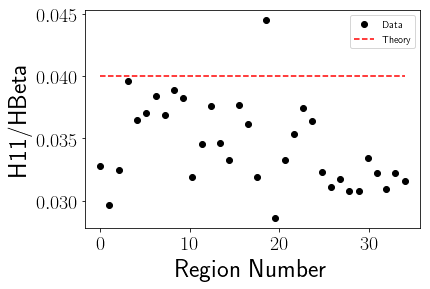

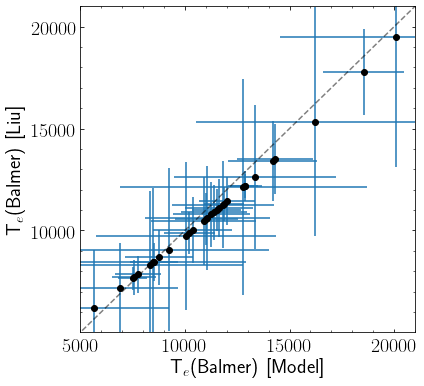

Median cHB fractional error.  0.1799208227438383
Median H11 fractional error.  0.022004684495932125
Median Jump fractional error.  0.020729863615532147
[0.1419984435956159, 0.2049442577818703, 0.07869867570739592, 0.06005459943056784, 0.04939912012761044, 0.7139411369659682, 2.055028466836334, 14.27724241592037, 0.21866031438736674, 0.09799320061098221, inf, 3.9989278437300824, 2.7391872952279415, 0.16997791896777084, 0.20930584672647898, 0.07855557206877489, 0.0846621225295614, 0.10467332619757186, 0.3975488779679389, 0.13018314775236775, 0.3066574449541546, 0.03509950843224368, 0.03674705201844464, 0.08441826269466157, 0.3519452912942217, 0.29693870961059515, 0.3266247036188715, 0.035544471767687574, 0.7847717236089602, 0.18103602481416228, 0.11358811278736668, 0.19660459687816514, 0.17880562067351433, 0.1647109137277754]


In [216]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator as aml
import math as math
from scipy import stats
%matplotlib inline

yPlus = 0.0925
yPlusErr = 0.0125
yPlusPlus = 0
OIIIflags =  np.array([1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1])  
NIIflags =  np.array([1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1])  
SIIIflags =  np.array([1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1])  
ratioH11HBetaArray= np.empty((nn))
BJDATA['jumpRatioErr'] = np.empty([nn])

for i in range(0,nn):
    fluxH11    = BJDATA['FLUX_H11'][i]         # un-reddening-corrected flux of H11 taken from fits file
    fluxH11Err = BJDATA['ERR_H11'][i]          # un-reddening-corrected H11 flux error 
    fluxHB     = BJDATA['FLUX_HB'][i]         # un-reddening-corrected flux of HB taken from fits file
    fluxHBErr  = BJDATA['ERR_HB'][i]          # un-reddening-corrected HB flux error 
    IH11       = BJDATA['IH11'][i] 
    IHBeta     = BJDATA['IHB'][i] 
    cHB        = BJDATA['CHB'][i]              # reddening correction at cHB 
    cHBErr     = BJDATA['CHBErr'][i]
    blue       = BJDATA['Blue'][i]
    blueErr    = BJDATA['BlueErr'][i]
    red        = BJDATA['Red'][i]
    redErr     = BJDATA['RedErr'][i]
    jump       = BJDATA['Jump'][i]
    jumpErr    = BJDATA['JumpErr'][i]
    tOIII      = BJDATA['T_OIII'][i]           # Ion temperature from OIII 
    tNII       = BJDATA['T_NII'][i]            # Ion temperature from OII 
    tSIII      = BJDATA['T_SIII'][i]           # Ion temperature from SIII 
    tOIIIerr   = BJDATA['T_OIII_UNC'][i]       # Ion temperature error from OIII 
    tNIIerr    = BJDATA['T_NII_UNC'][i]        # Ion temperature error from OII 
    tSIIIerr   = BJDATA['T_SIII_UNC'][i]       # Ion temperature error from SIII 

    if tOIII < 1:
        tOIII    =  BJDATA['T_OIII_USED'][i]
        tOIIIerr =  BJDATA['T_OIII_USED_UNC'][i]
    if tNII  < 1:
        tNII     = BJDATA['T_NII_USED'][i]
        tNIIerr  = BJDATA['T_NII_USED_UNC'][i]
    if tSIII  < 1:
        tSIII    = BJDATA['T_SIII_USED'][i]
        tSIIIerr = BJDATA['T_SIII_USED_UNC'][i]

    if red > 0:
        ratioRedH11     = red/fluxH11
        ratioRedHB      = red/fluxHB          
        logRedH11Corr   = m.log10(ratioRedH11) + (0.0186545*cHB)
        logRedHBCorr    = m.log10(ratioRedHB) + (0.3356279*cHB)
        ratioRedH11Corr = 10**logRedH11Corr
        ratioRedHBCorr  = 10**logRedHBCorr

    else:
        blue = blue - red
        red = 0.0
        ratioRedH11 = 0.0
        ratioRedH11Corr = 0.0       
        ratioRedHB = 0.0
        ratioRedHBCorr = 0.0 
        
    ratioH11HBeta = fluxH11/fluxHB
    BJDATA['H11HBObs'][i] = ratioH11HBeta
    logH11HBetaCorr = m.log10(ratioH11HBeta) + (0.316973*cHB)
    ratioH11HBetaCorr = 10**logH11HBetaCorr
    BJDATA['H11HBCorr'][i] = ratioH11HBetaCorr

    
    ratioBlueH11 = blue/fluxH11
    ratioBlueHB  = blue/fluxHB          
    logBlueH11Corr = m.log10(ratioBlueH11) + (0.0262377*cHB)
    logBlueHBCorr  = m.log10(ratioBlueHB) + (0.3432112*cHB)
    ratioBlueH11Corr = 10**logBlueH11Corr
    ratioBlueHBCorr  = 10**logBlueHBCorr
    BJDATA['RatioH11'][i]  = ratioBlueH11-ratioRedH11
    BJDATA['RatioH11Corr'][i] = ratioBlueH11Corr-ratioRedH11Corr
    BJDATA['RatioHBeta'][i]  = ratioBlueHB-ratioRedHB
    BJDATA['RatioHBetaCorr'][i] = ratioBlueHBCorr-ratioRedHBCorr 
        
    BJDATA['T(Bac)H11'][i] = 368*(1 + (0.259*yPlus) + (3.409*yPlusPlus))*((BJDATA['RatioH11Corr'][i])**(-1.5))
    BJDATA['T(Bac)HBeta'][i] = 10**(-0.64649*(np.log10(BJDATA['RatioHBetaCorr'][i]))**2)*10**(-4.10626*np.log10(BJDATA['RatioHBetaCorr'][i]))*10**(-1.90423)
    BJDATA['T(bac)H11Model'][i] = 10**(-1.148*(np.log10(BJDATA['RatioH11Corr'][i]))**2)*10**(-3.893*np.log10(BJDATA['RatioH11Corr'][i]))*10**(1.354)

#     jTerm = (3/2)*(368+95.312*yPlus)*(fluxH11)**(1.5)*(jump)**(-2.5)
#     H11Term = (3/2)*(368+95.312*yPlus)*(fluxH11)**(0.5)*(jump)**(-1.5) 
#     tErrSquared = (jTerm)**2 * jumpErr**2 + (H11Term)**2 * fluxH11Err**2
#     BJDATA['T(Bac)H11Err'][i] = tErrSquared**(0.5)

    #Determining Errors from Liu Method
    #derivatives
    dydRB = (-3/2*368*(1+0.259*0.0925))*(BJDATA['RatioH11Corr'][i])**(-5/2)
    dydRR = (3/2*368*(1+0.259*0.0925))*(BJDATA['RatioH11Corr'][i])**(-5/2)
    dRBdB = 1/fluxH11
    dRBdH11 = -blue/(fluxH11)**2
    dRBdcHB = 0.0262377
    dRRdR = 1/fluxH11
    dRRdH11 = -red/(fluxH11)**2
    dRRdcHB = 0.0186545
    #uncertainties
    sigB = blueErr
    sigR = redErr
    sigH11 = fluxH11Err
    sigcHB = cHBErr
    sigRB = ((dRBdB*sigB)**2+(dRBdH11*sigH11)**2+(dRBdcHB*sigcHB)**2)**0.5
    sigRR = ((dRRdR*sigR)**2+(dRRdH11*sigH11)**2+(dRRdcHB*sigcHB)**2)**0.5
    #Final Error Calculation
    BJDATA['T(Bac)H11Err'][i] = ((dydRB*sigRB)**2+(dydRR*sigRR)**2)**0.5

#    BJDATA['jumpRatioErr'][i] = jumpRatioErr
#    BJDATA['T(Bac)H11Err'][i] = ((cHBErr/cHB)**2+(jumpErr/jump)**2+(fluxH11Err/fluxH11)**2)**0.5*BJDATA['T(Bac)H11'][i]
#    BJDATA['T(Bac)H11Err'][i] = ((jumpErr/jump)**2+(fluxH11Err/fluxH11)**2)**0.5*BJDATA['T(Bac)H11'][i]

#     #derivative of model for error analysis:
#     modelTerm = (np.e**(-0.499*(np.log(rat))**2)*(-22.53*np.log(rat)-87.96))/(rat**4.893)
#     #modelTerm = BJDATA['T(bac)H11Model'][i]*((2*(-1.148/BJDATA['RatioH11Corr'][i]))+(-3.893/BJDATA['RatioH11Corr'][i]))
#     #for our model errors we are adding the model uncertainty with the ratio uncertainty in quadrature
#     #first we find the uncertainty in the ratio itself
#     ratioErr = BJDATA['RatioH11Corr'][i]*((jumpErr/jump)**2+(fluxH11Err/fluxH11)**2)**0.5
#     #then propogate the uncertainty through the model equation
#     propRatioErr = modelTerm*ratioErr    
#     #model error assigned by Danielle
     modelErr = (0.05)    
#     #add in quadrature for total model uncertainty
#     BJDATA['T(bac)H11ModelErr'][i] = (propRatioErr**2+modelErr**2)**0.5
    #BJDATA['T(bac)H11ModelErr'][i] = (ratioErr**2+modelErr**2)**0.5
    #BJDATA['T(bac)H11ModelErr'][i] = (modelErr**2 + (jumpErr/jump)**2+(fluxH11Err/fluxH11)**2)**0.5*BJDATA['T(bac)H11Model'][i]

    #derivative of model for error analysis:
    rat = BJDATA['RatioH11Corr'][i]
    modelTerm = (np.e**(-0.499*(np.log(rat))**2)*(-22.53*np.log(rat)-87.96))/(rat**4.893)
    sigRatio = (sigRB**2+sigRR**2)**0.5
    BJDATA['T(bac)H11ModelErr'][i] = ((modelTerm*sigRatio)**2+modelErr**2)**0.5
    
    jTerm = 1/(fluxHB)
    HBTerm = (jump)/(fluxHB**2) 
    tErrSquared = ((jTerm)**2 * jumpErr**2) + ((HBTerm)**2 * fluxHBErr**2)
    BJDATA['T(Bac)HBetaErr'][i] = tErrSquared**(0.5)

    BJDATA['TOIII'][i]    = tOIII
    BJDATA['TNII'][i]     = tNII
    BJDATA['TSIII'][i]    = tSIII
    BJDATA['TOIIIErr'][i] = tOIIIerr
    BJDATA['TNIIErr'][i]  = tNIIerr
    BJDATA['TSIIIErr'][i] = tSIIIerr
    
    #den = den[0]
    #dene = dene[0]
    #den = 100
    #tem = BJDATA['T(Bac)'][i]
    #teme = BJDATA['T(Bac)Err'][i]
    #tema  = np.array([tem-teme,tem-teme,tem+teme,tem+teme,tem-teme,tem-teme,tem+teme,tem+teme])
    #dena   = np.array([den,den,den,den, den,den,den,den])
    #dena   = np.array([den-dene,den+dene,den-dene,den+dene, den-dene,den+dene,den-dene,den+dene])

    # OXYGEN:
    # O+/H+: 
    #o2r,o2re = (BJDATA['IO3727'][i]+BJDATA['IO3729'][i])*100,(np.sqrt(BJDATA['EO3727'][i]**2+BJDATA['EO3729'][i]**2))*100
    #o2ra     = np.array([o2r-o2re,o2r-o2re,o2r-o2re,o2r-o2re,o2r+o2re,o2r+o2re,o2r+o2re,o2r+o2re])
    #o2a      = O2.getIonAbundance(int_ratio=o2r,  tem=tem,  den=den,  to_eval='L(3726)+L(3728)')
    #o2aea    = O2.getIonAbundance(int_ratio=o2ra, tem=tema, den=dena, to_eval='L(3726)+L(3728)')
    #o2ae     = np.nanstd(o2aea) 
    # O++/H+:
    #o3r,o3re = (BJDATA['IO4959'][i]+BJDATA['IO5007'][i])*100, (np.sqrt(BJDATA['EO4959'][i]**2+BJDATA['EO5007'][i]**2))*100
    #o3ra     = np.array([o3r-o3re,o3r-o3re,o3r-o3re,o3r-o3re,o3r+o3re,o3r+o3re,o3r+o3re,o3r+o3re])
    #o3a   = O3.getIonAbundance(int_ratio=o3r,  tem=tem,  den=den,  to_eval='L(4959)+L(5007)')
    #o3aea    = O3.getIonAbundance(int_ratio=o3ra, tem=tema, den=dena, to_eval='L(4959)+L(5007)')
    #o3ae  = np.nanstd(o3aea) 
    # Total O:
    #BJDATA['OA'][i], BJDATA['OAE'][i] = o2a+o3a, np.sqrt(o2ae**2+o3ae**2)
    #BJDATA['LOH'][i], BJDATA['LOHE'][i] = 12.+np.log10(BJDATA['OA'][i]), np.log10(1.+(BJDATA['OAE'][i]/BJDATA['OA'][i]))   #0.434*(oae[j]/oa[j]) #  

H11HB = BJDATA['H11HBCorr']
tBacH11 = BJDATA['T(Bac)H11']
tBacHB = BJDATA['T(Bac)HBeta']
tBacH11Err = BJDATA['T(Bac)H11Err']
tBacHBErr = BJDATA['T(Bac)HBetaErr']

def ratioEqn(x,y):
    return x/y
 
cHBFracErr = list(map(ratioEqn, BJDATA["CHBErr"],BJDATA["CHB"]))
#print(cHBFracErr)
H11FracErr = list(map(ratioEqn, BJDATA['ERR_H11'],BJDATA['FLUX_H11']))
#print(H11FracErr) 
# JumpFracErr = list(map(ratioEqn, BJDATA['jumpRatioErr'], BJDATA['Jump']))
# print(JumpFracErr)
JumpFracErrOrig = list(map(ratioEqn, BJDATA['JumpErr'], BJDATA['Jump']))
# print(JumpFracErrOrig)
###########################################################################################
# H11/HB comparison plot
###########################################################################################
n = len(H11HB)
dispersion = np.linspace(0,n, n)
line = np.empty(len(H11HB))
for i in range(len(line)):
    line[i] = 0.04
plt.plot(dispersion, H11HB, marker = 'o', linestyle = '', color = 'k', label = 'Data')
plt.plot(dispersion, line, marker = '', linestyle = '--', color = 'red', label = "Theory")
plt.ylabel('H11/HBeta', fontsize=25)
plt.xlabel('Region Number', fontsize=25)
plt.legend(loc='best')
plt.savefig('H11vsHB.pdf')
############################################################################################
# Model vs Liu Plot
############################################################################################
plt.rc('text',usetex=True)
fontsize=20
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)
start = 4000
end = 26000
p = np.linspace(start,end)
q = p
ticks = [5000,7500,10000,12500,15000]     

mpl.rcParams["axes.labelsize"] = 25
mpl.rcParams["xtick.labelsize"] = 20
mpl.rcParams["ytick.labelsize"] = 20

# lowestTemp = [np.min(tBacH11), np.min(tBacHB)]
# lowest = np.min(lowestTemp)
# highestTemp = [np.max(tBacH11), np.max(tBacHB)]
# highest = np.max(highestTemp)
# start = lowest * 0.9
# end = highest * 1.1
# p = np.linspace(start,end)
# q = p

fig = plt.figure(figsize=(6,6))
axes = 1 * [None]
axes[0] = fig.add_subplot(111, facecolor = "white")
axes[0].tick_params(direction = "in", which = "both")
axes[0].xaxis.set_ticks_position("both")
axes[0].yaxis.set_ticks_position("both")
axes[0].xaxis.set_minor_locator(aml())
axes[0].yaxis.set_minor_locator(aml())
axes[0].xaxis.set_ticks([5000, 10000, 15000, 20000, 25000])
axes[0].yaxis.set_ticks([10000, 15000, 20000, 25000])
axes[0].set_ylabel(r"T$_e$(Balmer) [Liu]", fontsize = 20)
axes[0].set_xlabel(r"T$_e$(Balmer) [Model]", fontsize = 20)
axes[0].scatter(BJDATA['T(bac)H11Model'], BJDATA['T(Bac)H11'], c = 'k', marker = 'o', zorder = 2)
axes[0].errorbar(BJDATA['T(bac)H11Model'], BJDATA['T(Bac)H11'], yerr = BJDATA['T(Bac)H11Err'], xerr = BJDATA['T(bac)H11ModelErr'], linestyle = '', fmt = '', zorder = 1)
axes[0].plot(p, q, linestyle = '--', c = 'k', alpha = 0.5)
axes[0].set_xlim([5000, 21000])
axes[0].set_ylim([5000, 21000])

plt.savefig('TBacH11ModelvsLiu.pdf')
plt.show()
#print(BJDATA['CHBErr'])
#print(BJDATA['T(Bac)H11Err'])
#print(BJDATA['T(bac)H11ModelErr'])
print("Median cHB fractional error. ",np.median(cHBFracErr))
print("Median H11 fractional error. ",np.median(H11FracErr))
print("Median Jump fractional error. ",np.median(JumpFracErrOrig))
# print(np.median(JumpFracErr))
# print(np.median(JumpFracErrOrig))
print(cHBFracErr)

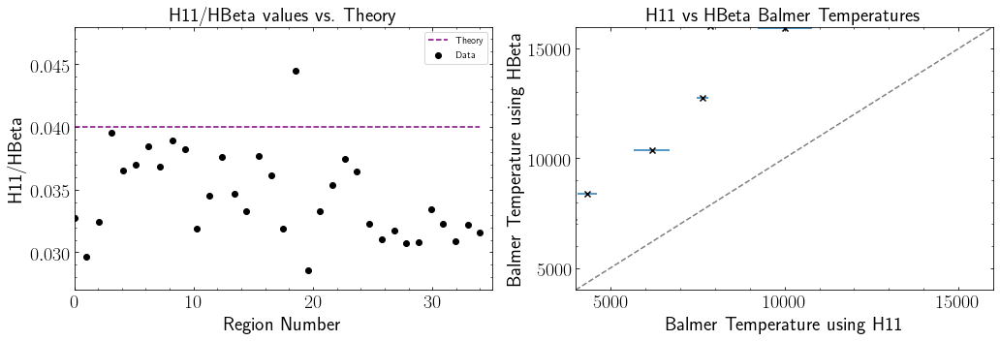

In [86]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator as aml

region = BJDATA['Region']
H11HB = BJDATA['H11HBCorr']
tBacH11 = BJDATA['T(Bac)H11']
tBacHB = BJDATA['T(Bac)HBeta']
tBacH11Err = BJDATA['T(Bac)H11Err']
tBacHBErr = BJDATA['T(Bac)HBetaErr']

n = len(H11HB)
dispersion = np.linspace(0,n, n)
line = np.empty(len(H11HB))
for i in range(len(line)):
    line[i] = 0.04


fig = plt.figure(figsize = (17, 5))

axes = 2 * [None]
for i in range(2):
    axes[i] = fig.add_subplot(121 + i, facecolor = "white")
    axes[i].tick_params(direction = "in", which = "both")
    axes[i].xaxis.set_ticks_position("both")
    axes[i].yaxis.set_ticks_position("both")
    axes[i].xaxis.set_ticks_position("both")
    axes[i].yaxis.set_ticks_position("both")
    axes[i].xaxis.set_minor_locator(aml())
    axes[i].yaxis.set_minor_locator(aml())
    
axes[0].xaxis.set_ticks([0, 10, 20,30])
axes[0].yaxis.set_ticks([0.025, 0.03,0.035,0.04, 0.045])
axes[0].set_xlim([0, 35])
axes[0].set_ylim([0.027, 0.048])
axes[1].xaxis.set_ticks([5000, 10000, 15000, 20000])
axes[1].yaxis.set_ticks([5000, 10000, 15000, 20000])
axes[1].set_xlim([4000, 16000])
axes[1].set_ylim([4000, 16000])


plt.subplots_adjust(wspace = 0.2)

axes[0].set_ylabel('H11/HBeta', fontsize = 20)
axes[0].set_xlabel('Region Number', fontsize = 20)
axes[1].set_xlabel('Balmer Temperature using H11', fontsize = 20)
axes[1].set_ylabel('Balmer Temperature using HBeta', fontsize = 20)
axes[0].plot(dispersion, line, c = 'purple', linestyle = '--', label = 'Theory')
axes[0].scatter(dispersion, H11HB, c = 'k', marker = 'o', label = 'Data')
axes[1].scatter(tBacH11, tBacHB, c = 'k', marker = 'x', zorder = 2)
axes[1].errorbar(tBacH11, tBacHB, yerr=tBacHBErr, xerr=tBacH11Err, linestyle='',fmt ='', zorder = 1)
axes[0].set_title('H11/HBeta values vs. Theory', fontsize=20)
axes[1].set_title('H11 vs HBeta Balmer Temperatures', fontsize=20)
axes[0].legend(loc='best')
for i in range(2):
    if i==1:
        axes[i].plot(p, q, linestyle = '--', c = 'k', alpha = 0.5)
plt.savefig('H11vsHBeta.pdf')

In [87]:
np.set_printoptions(precision=0)

with open("BJLatexTable.txt", "w") as text_file:
    for i in range(0,nn):
        print(regionName[i],'&','{0:.0f}'.format(BJDATA['T(Bac)H11'][i]),'$\pm$','{0:.0f}'.format(BJDATA['T(Bac)H11Err'][i]),'{0:.0f}'.format(BJDATA['T(Bac)HBeta'][i]),'$\pm$','{0:.0f}'.format(BJDATA['T(Bac)HBetaErr'][i]),'&','{0:.0f}'.format(BJDATA['TOIII'][i]),'$\pm$','{0:.0f}'.format(BJDATA['TOIIIErr'][i]),'&', OIIIflags[i],'&','{0:.0f}'.format(BJDATA['TNII'][i]),'$\pm$','{0:.0f}'.format(BJDATA['TNIIErr'][i]),'&', NIIflags[i],'&','{0:.0f}'.format(BJDATA['TSIII'][i]),'$\pm$','{0:.0f}'.format(BJDATA['TSIIIErr'][i]),'&', SIIIflags[i],'&', flags[i],'\\', file=text_file)
    print('Region:', BJDATA['Region'], file=text_file) 
    print('T(Bac) H11:', BJDATA['T(Bac)H11'], file=text_file)    
    print('T(Bac) H11 Err:', BJDATA['T(Bac)H11Err'], file=text_file)  
    print('T(Bac) HBeta:', BJDATA['T(Bac)HBeta'], file=text_file)    
    print('T(Bac) HBeta Err:', BJDATA['T(Bac)HBetaErr'], file=text_file) 
    print('TOIII:', BJDATA['TOIII'], file=text_file)
    print('TOIII Err:', BJDATA['TOIIIErr'], file=text_file)
    print('TOIII Flag:', OIIIflags, file=text_file)    
    print('TNII:', BJDATA['TNII'], file=text_file)
    print('TNII Err:', BJDATA['TNIIErr'], file=text_file)
    print('TNII Flag:', NIIflags, file=text_file)    
    print('TSIII:', BJDATA['TSIII'], file=text_file)
    print('TSIII Err:', BJDATA['TSIIIErr'], file=text_file)
    print('TSIII Flag:', SIIIflags, file=text_file)    
    print('Good Set Flags:', flags, file=text_file)

In [88]:
np.set_printoptions(precision=0)
with open("tempArray.txt", "w") as text_file:
    print('#Region  ','TBac H11','TBac H11 Err ', 'TBac HBeta','TBac HBeta Err ','T[OIII] ','T[OIII]Err ','OIII Flag','T[NII]','T[NII]Err ','NII Flag','T[SIII] ','T[SIII]Err ','SIII Flag','Flag', file=text_file) 
    for i in range(0,nn):
        print(regionName[i],'{0:.0f}'.format(BJDATA['T(Bac)H11'][i]),'{0:.0f}'.format(BJDATA['T(Bac)H11Err'][i]),'{0:.0f}'.format(BJDATA['T(Bac)HBeta'][i]),'{0:.0f}'.format(BJDATA['T(Bac)HBetaErr'][i]),'{0:.0f}'.format(BJDATA['TOIII'][i]),'{0:.0f}'.format(BJDATA['TOIIIErr'][i]),OIIIflags[i],'{0:.0f}'.format(BJDATA['TNII'][i]),'{0:.0f}'.format(BJDATA['TNIIErr'][i]),NIIflags[i],'{0:.0f}'.format(BJDATA['TSIII'][i]),'{0:.0f}'.format(BJDATA['TSIIIErr'][i]),SIIIflags[i],flags[i], file=text_file)


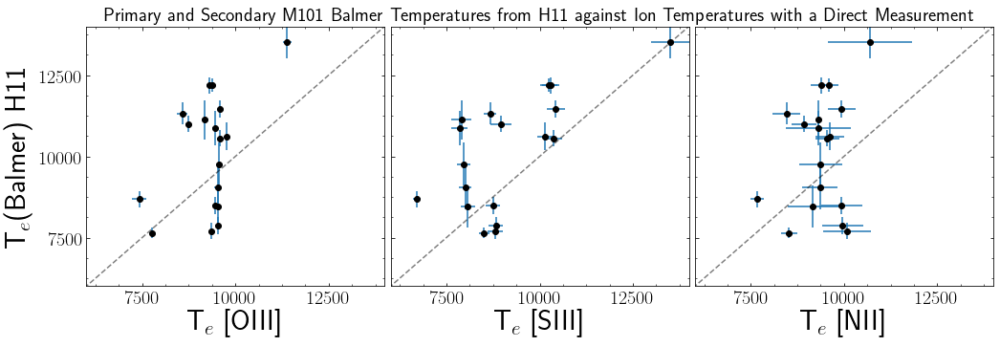

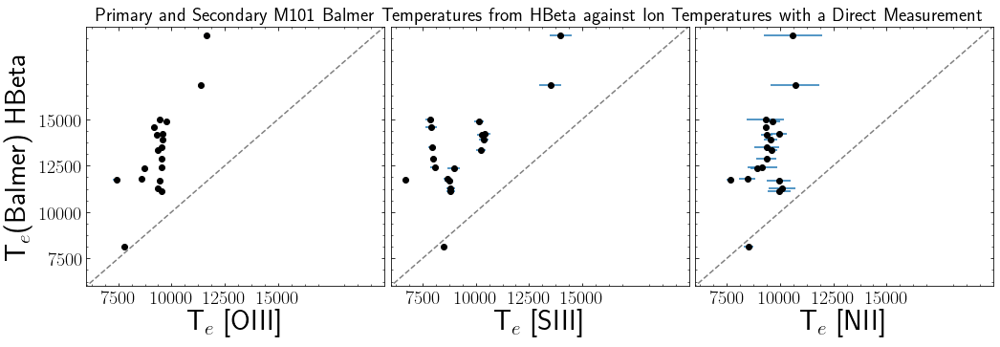

In [106]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator as aml
import math as math
from scipy import stats
%matplotlib inline
outfile = 'tempArray.txt'
plt.rc('text',usetex=True)
fontsize=40
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

region = np.loadtxt(outfile, dtype = str,unpack=True, usecols=(0))
tBacH11, tBacH11Err,tBacHB, tBacHBErr,tOIII, tOIIIErr, oiiiflags, tNII, tNIIErr, niiflags,tSIII, tSIIIErr, siiiflags, flag = np.loadtxt(outfile, unpack=True, usecols=(1,2,3,4,5,6,7,8,9,10,11,12,13,14))

        
TBacH11VOIII    = []
eTBacH11VOIII   = []
TBacH11VNII    = []
eTBacH11VNII   = []
TBacH11VSIII    = []
eTBacH11VSIII   = []
TBacHBVOIII    = []
eTBacHBVOIII   = []
TBacHBVNII    = []
eTBacHBVNII   = []
TBacHBVSIII    = []
eTBacHBVSIII   = []
T_OIII  = []
eT_OIII = []
T_NII   = []
eT_NII  = []
T_SIII  = []
eT_SIII = []

#Make sure the Temps have measurements. 
# Populate arrays based on what has measurements.
for n in range (len(tBacH11)):
    if flags[n] ==1:
        if oiiiflags[n] == 1:
            TBacH11VOIII.append(tBacH11[n])
            eTBacH11VOIII.append(tBacH11Err[n])
            TBacHBVOIII.append(tBacHB[n])
            eTBacHBVOIII.append(tBacHBErr[n])
            T_OIII.append(tOIII[n])
            eT_OIII.append(tOIIIErr[n])
        if niiflags[n] == 1:    
            TBacH11VNII.append(tBacH11[n])
            eTBacH11VNII.append(tBacH11Err[n])
            TBacHBVNII.append(tBacHB[n])
            eTBacHBVNII.append(tBacHBErr[n])
            T_NII.append(tNII[n])
            eT_NII.append(tNIIErr[n])
        if siiiflags[n] == 1:    
            TBacH11VSIII.append(tBacH11[n])
            eTBacH11VSIII.append(tBacH11Err[n])
            TBacHBVSIII.append(tBacHB[n])
            eTBacHBVSIII.append(tBacHBErr[n])
            T_SIII.append(tSIII[n])
            eT_SIII.append(tSIIIErr[n])

start = 4000
end = 20000
p = np.linspace(start,end)
q = p
ticks = [5000,7500,10000,12500,15000, 17500, 20000]     

mpl.rcParams["axes.labelsize"] = 25
mpl.rcParams["xtick.labelsize"] = 20
mpl.rcParams["ytick.labelsize"] = 20

fig = plt.figure(figsize = (17, 5))
#plt.title('Primary and Secondary Balmer Temperatures against Ion Temperatures with a Direct Measurement', fontsize = 20)
axes = 3 * [None]
for i in range(3):
    if i == 0:
        axes[i] = fig.add_subplot(131 + i, facecolor = "white")
    else:
        axes[i] = fig.add_subplot(131 + i, facecolor = "white", sharey = axes[0])  
    axes[i].tick_params(direction = "in", which = "both")
    axes[i].xaxis.set_ticks_position("both")
    axes[i].yaxis.set_ticks_position("both")
    axes[i].xaxis.set_minor_locator(aml())
    axes[i].yaxis.set_minor_locator(aml())
    axes[i].xaxis.set_ticks([7500, 10000, 12500, 15000])
    axes[i].yaxis.set_ticks([7500, 10000, 12500, 15000])

    if i != 0:
        plt.setp(axes[i].get_yticklabels(), visible = False)

plt.subplots_adjust(wspace = 0.02)
axes[0].set_ylabel(r"T$_e$(Balmer) H11", fontsize = 30)
axes[0].set_xlabel(r"T$_e$ [OIII]", fontsize = 30)
axes[1].set_xlabel(r"T$_e$ [SIII]", fontsize = 30)
axes[2].set_xlabel(r"T$_e$ [NII]", fontsize = 30)
axes[0].scatter(T_OIII, TBacH11VOIII, c = 'k', marker = 'o', zorder = 2)
axes[1].scatter(T_SIII, TBacH11VSIII, c = 'k', marker = 'o', zorder = 2)
axes[2].scatter(T_NII, TBacH11VNII, c = 'k', marker = 'o', zorder = 2)
axes[0].errorbar(T_OIII, TBacH11VOIII, yerr = eTBacH11VOIII, xerr = eT_OIII, linestyle = '', fmt = '', zorder = 1)
axes[1].errorbar(T_SIII, TBacH11VSIII, yerr=eTBacH11VSIII, xerr=eT_SIII, linestyle='',fmt ='', zorder = 1)
axes[2].errorbar(T_NII, TBacH11VNII, yerr=eTBacH11VNII, xerr=eT_NII, linestyle='',fmt ='', zorder = 1)
axes[1].set_title('Primary and Secondary M101 Balmer Temperatures from H11 against Ion Temperatures with a Direct Measurement', fontsize=20)
for i in range(3):
    axes[i].plot(p, q, linestyle = '--', c = 'k', alpha = 0.5)
for i in range(3):
    axes[i].set_xlim([6000, 14000])
    axes[i].set_ylim([6000, 14000])

# axes[0].set_xlim([4000, 13000])
# axes[1].set_xlim([4000, 16000])
# axes[2].set_xlim([4000, 13000])
plt.savefig('BalmerH11VIonTemperaturesAll.pdf')
    

fig = plt.figure(figsize = (17, 5))
#plt.title('Primary and Secondary Balmer Temperatures against Ion Temperatures with a Direct Measurement', fontsize = 20)
axes = 3 * [None]
for i in range(3):
    if i == 0:
        axes[i] = fig.add_subplot(131 + i, facecolor = "white")
    else:
        axes[i] = fig.add_subplot(131 + i, facecolor = "white", sharey = axes[0])  
    axes[i].tick_params(direction = "in", which = "both")
    axes[i].xaxis.set_ticks_position("both")
    axes[i].yaxis.set_ticks_position("both")
    axes[i].xaxis.set_minor_locator(aml())
    axes[i].yaxis.set_minor_locator(aml())
    axes[i].xaxis.set_ticks([7500, 10000, 12500, 15000])
    axes[i].yaxis.set_ticks([7500, 10000, 12500, 15000])

    if i != 0:
        plt.setp(axes[i].get_yticklabels(), visible = False)

plt.subplots_adjust(wspace = 0.02)
axes[0].set_ylabel(r"T$_e$(Balmer) HBeta", fontsize = 30)
axes[0].set_xlabel(r"T$_e$ [OIII]", fontsize = 30)
axes[1].set_xlabel(r"T$_e$ [SIII]", fontsize = 30)
axes[2].set_xlabel(r"T$_e$ [NII]", fontsize = 30)
axes[0].scatter(T_OIII, TBacHBVOIII, c = 'k', marker = 'o', zorder = 2)
axes[1].scatter(T_SIII, TBacHBVSIII, c = 'k', marker = 'o', zorder = 2)
axes[2].scatter(T_NII, TBacHBVNII, c = 'k', marker = 'o', zorder = 2)
axes[0].errorbar(T_OIII, TBacHBVOIII, yerr = eTBacHBVOIII, xerr = eT_OIII, linestyle = '', fmt = '', zorder = 1)
axes[1].errorbar(T_SIII, TBacHBVSIII, yerr=eTBacHBVSIII, xerr=eT_SIII, linestyle='',fmt ='', zorder = 1)
axes[2].errorbar(T_NII, TBacHBVNII, yerr=eTBacHBVNII, xerr=eT_NII, linestyle='',fmt ='', zorder = 1)
axes[1].set_title('Primary and Secondary M101 Balmer Temperatures from HBeta against Ion Temperatures with a Direct Measurement', fontsize=20)
for i in range(3):
    axes[i].plot(p, q, linestyle = '--', c = 'k', alpha = 0.5)
for i in range(3):
    axes[i].set_xlim([6000, 20000])
    axes[i].set_ylim([6000, 20000])

# axes[0].set_xlim([4000, 13000])
# axes[1].set_xlim([4000, 16000])
# axes[2].set_xlim([4000, 13000])
plt.savefig('BalmerHBetaVIonTemperaturesAll.pdf')   

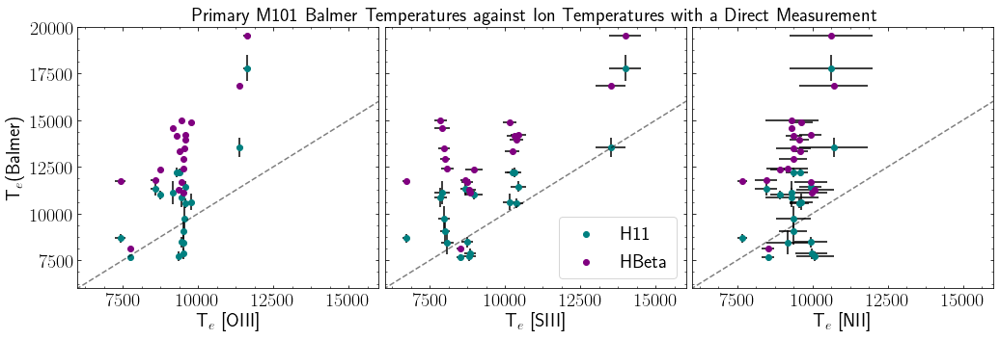

In [119]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator as aml
import math as math
from scipy import stats
%matplotlib inline
outfile = 'tempArray.txt'
plt.rc('text',usetex=True)
fontsize=40
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

region = np.loadtxt(outfile, dtype = str,unpack=True, usecols=(0))
tBacH11, tBacH11Err,tBacHB, tBacHBErr,tOIII, tOIIIErr, oiiiflags, tNII, tNIIErr, niiflags,tSIII, tSIIIErr, siiiflags, flag = np.loadtxt(outfile, unpack=True, usecols=(1,2,3,4,5,6,7,8,9,10,11,12,13,14))

        
TBacH11VOIII    = []
eTBacH11VOIII   = []
TBacH11VNII    = []
eTBacH11VNII   = []
TBacH11VSIII    = []
eTBacH11VSIII   = []
TBacHBVOIII    = []
eTBacHBVOIII   = []
TBacHBVNII    = []
eTBacHBVNII   = []
TBacHBVSIII    = []
eTBacHBVSIII   = []
T_OIII  = []
eT_OIII = []
T_NII   = []
eT_NII  = []
T_SIII  = []
eT_SIII = []

#Make sure the Temps have measurements. 
# Populate arrays based on what has measurements.
for n in range (len(tBacH11)):
    if flags[n] ==1:
        if oiiiflags[n] == 1:
            TBacH11VOIII.append(tBacH11[n])
            eTBacH11VOIII.append(tBacH11Err[n])
            TBacHBVOIII.append(tBacHB[n])
            eTBacHBVOIII.append(tBacHBErr[n])
            T_OIII.append(tOIII[n])
            eT_OIII.append(tOIIIErr[n])
        if niiflags[n] == 1:    
            TBacH11VNII.append(tBacH11[n])
            eTBacH11VNII.append(tBacH11Err[n])
            TBacHBVNII.append(tBacHB[n])
            eTBacHBVNII.append(tBacHBErr[n])
            T_NII.append(tNII[n])
            eT_NII.append(tNIIErr[n])
        if siiiflags[n] == 1:    
            TBacH11VSIII.append(tBacH11[n])
            eTBacH11VSIII.append(tBacH11Err[n])
            TBacHBVSIII.append(tBacHB[n])
            eTBacHBVSIII.append(tBacHBErr[n])
            T_SIII.append(tSIII[n])
            eT_SIII.append(tSIIIErr[n])

start = 4000
end = 20000
p = np.linspace(start,end)
q = p
ticks = [5000,7500,10000,12500,15000, 17500, 20000]     

mpl.rcParams["axes.labelsize"] = 25
mpl.rcParams["xtick.labelsize"] = 20
mpl.rcParams["ytick.labelsize"] = 20

fig = plt.figure(figsize = (17, 5))
#plt.title('Primary and Secondary Balmer Temperatures against Ion Temperatures with a Direct Measurement', fontsize = 20)
axes = 3 * [None]
for i in range(3):
    if i == 0:
        axes[i] = fig.add_subplot(131 + i, facecolor = "white")
    else:
        axes[i] = fig.add_subplot(131 + i, facecolor = "white", sharey = axes[0])  
    axes[i].tick_params(direction = "in", which = "both")
    axes[i].xaxis.set_ticks_position("both")
    axes[i].yaxis.set_ticks_position("both")
    axes[i].xaxis.set_minor_locator(aml())
    axes[i].yaxis.set_minor_locator(aml())
    axes[i].xaxis.set_ticks([5000,7500, 10000, 12500, 15000,17500,20000])
    axes[i].yaxis.set_ticks([5000,7500, 10000, 12500, 15000,17500,20000])

    if i != 0:
        plt.setp(axes[i].get_yticklabels(), visible = False)

plt.subplots_adjust(wspace = 0.02)
axes[0].set_ylabel(r"T$_e$(Balmer)", fontsize = 20)
axes[0].set_xlabel(r"T$_e$ [OIII]", fontsize = 20)
axes[1].set_xlabel(r"T$_e$ [SIII]", fontsize = 20)
axes[2].set_xlabel(r"T$_e$ [NII]", fontsize = 20)
axes[0].scatter(T_OIII, TBacH11VOIII, c = 'teal', marker = 'o', zorder = 2)
axes[1].scatter(T_SIII, TBacH11VSIII, c = 'teal', marker = 'o', zorder = 2, label = 'H11')
axes[2].scatter(T_NII, TBacH11VNII, c = 'teal', marker = 'o', zorder = 2)
axes[0].errorbar(T_OIII, TBacH11VOIII, yerr = eTBacH11VOIII, xerr = eT_OIII, linestyle = '', fmt = '', zorder = 1, c='k')
axes[1].errorbar(T_SIII, TBacH11VSIII, yerr=eTBacH11VSIII, xerr=eT_SIII, linestyle='',fmt ='', zorder = 1,c='k')
axes[2].errorbar(T_NII, TBacH11VNII, yerr=eTBacH11VNII, xerr=eT_NII, linestyle='',fmt ='', zorder = 1,c='k')
axes[0].scatter(T_OIII, TBacHBVOIII, c = 'purple', marker = 'o', zorder = 2)
axes[1].scatter(T_SIII, TBacHBVSIII, c = 'purple', marker = 'o', zorder = 2, label = "HBeta")
axes[2].scatter(T_NII, TBacHBVNII, c = 'purple', marker = 'o', zorder = 2)
axes[0].errorbar(T_OIII, TBacHBVOIII, yerr = eTBacHBVOIII, xerr = eT_OIII, linestyle = '', fmt = '', zorder = 1,c='k')
axes[1].errorbar(T_SIII, TBacHBVSIII, yerr=eTBacHBVSIII, xerr=eT_SIII, linestyle='',fmt ='', zorder = 1,c='k')
axes[2].errorbar(T_NII, TBacHBVNII, yerr=eTBacHBVNII, xerr=eT_NII, linestyle='',fmt ='', zorder = 1,c='k')
axes[1].legend(loc=4, fontsize = 20)
axes[1].set_title('Primary M101 Balmer Temperatures against Ion Temperatures with a Direct Measurement', fontsize=20)
for i in range(3):
    axes[i].plot(p, q, linestyle = '--', c = 'k', alpha = 0.5)
for i in range(3):
    axes[i].set_xlim([6000, 16000])
    axes[i].set_ylim([6000, 20000])

# axes[0].set_xlim([4000, 13000])
# axes[1].set_xlim([4000, 16000])
# axes[2].set_xlim([4000, 13000])
plt.savefig('BalmerH11HBVIonTemperaturesAll.pdf')

21553.0 3610.0


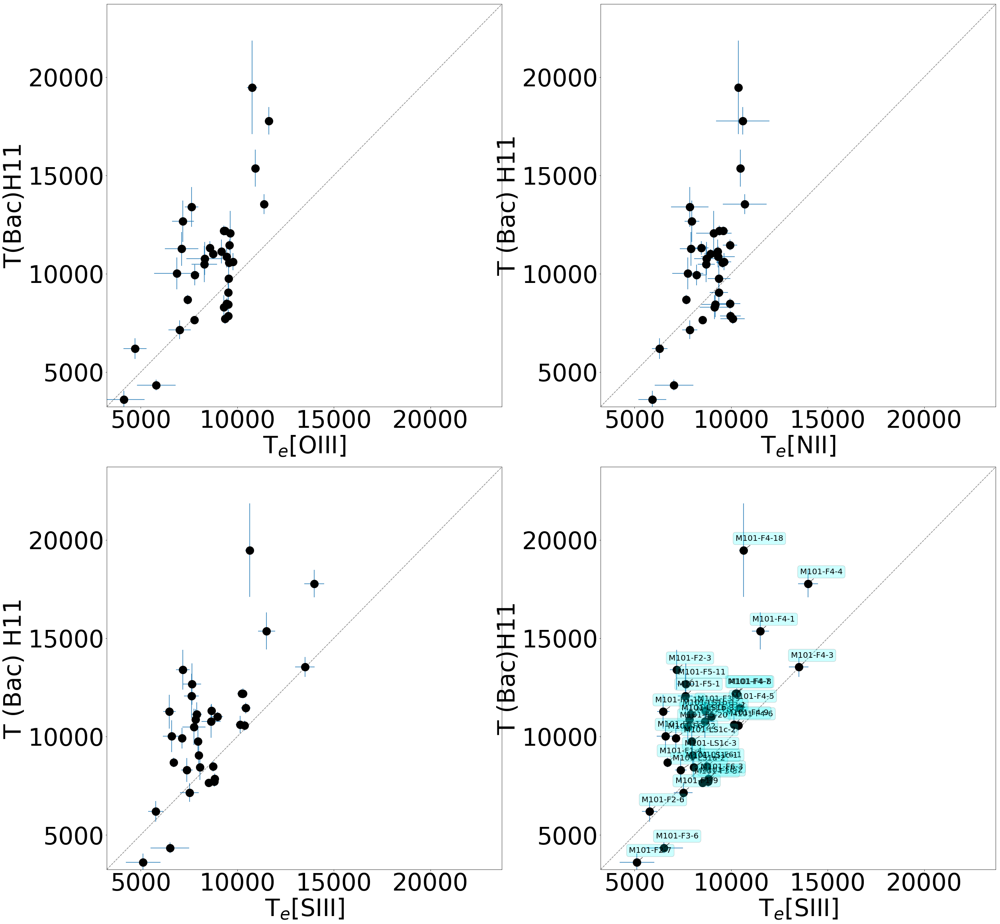

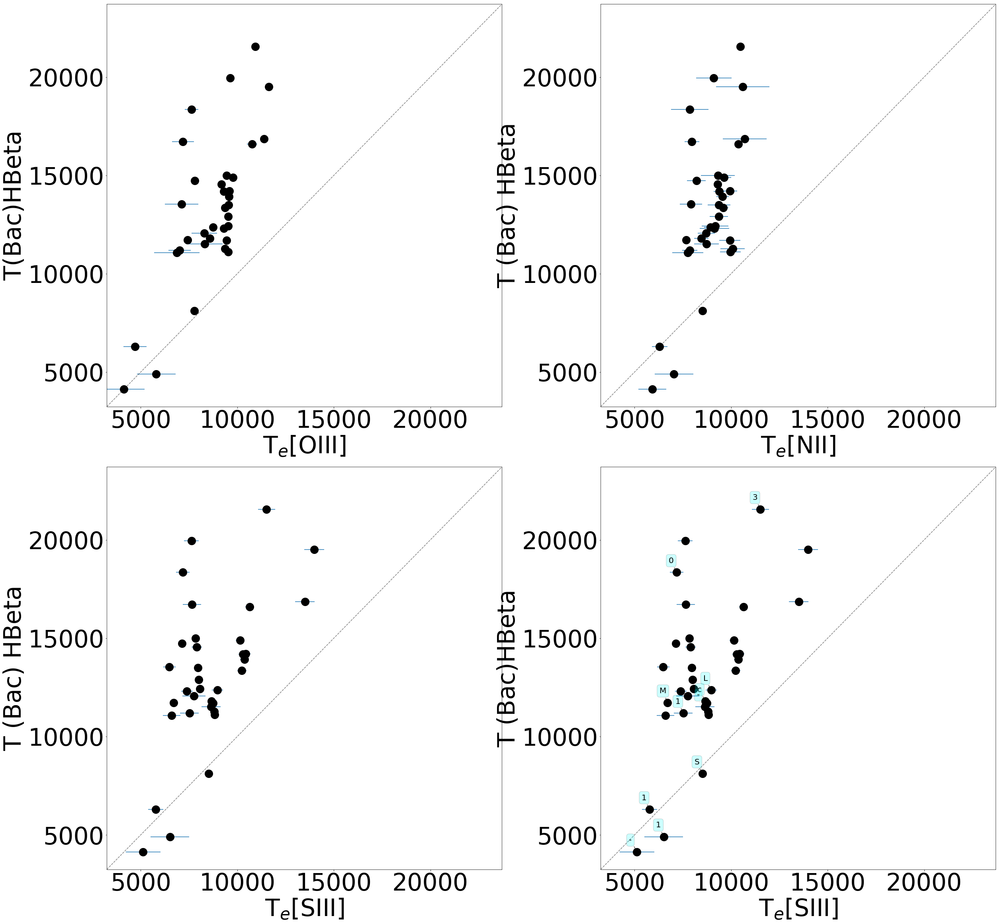

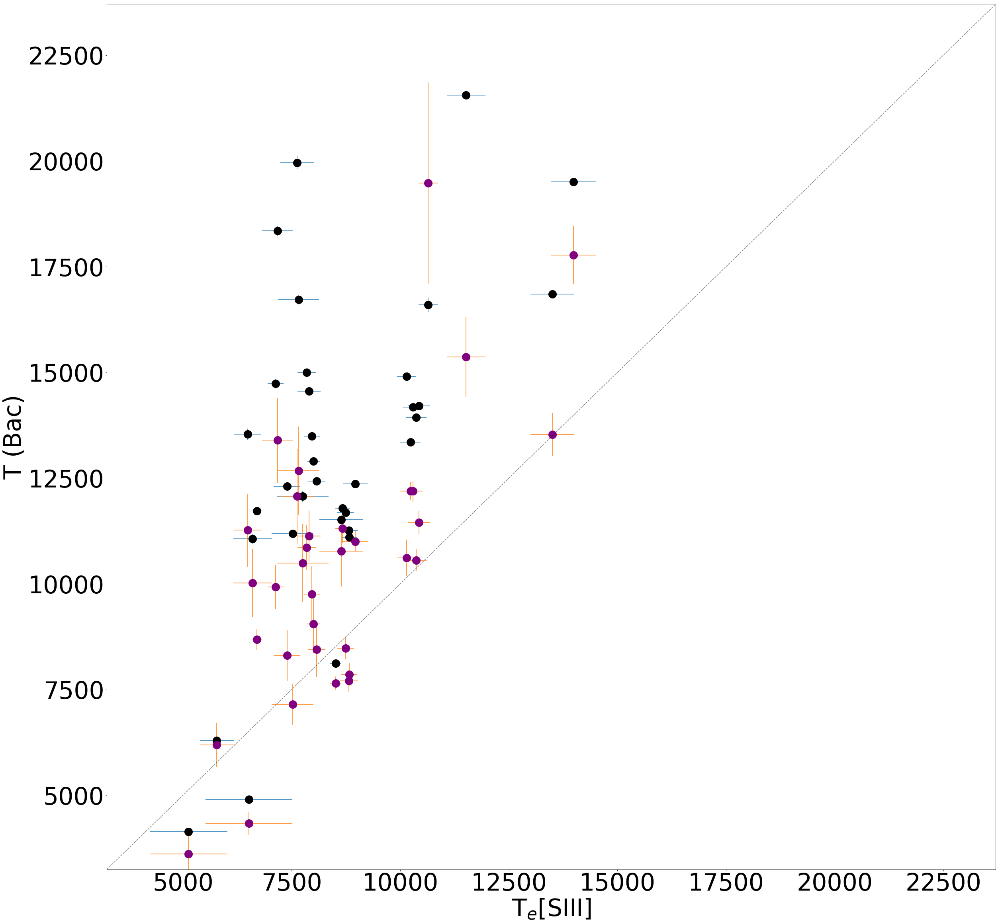

<Figure size 432x288 with 0 Axes>

In [89]:
import numpy as np
import matplotlib.pyplot as plt
import math as math
from scipy import stats

%matplotlib inline

outfile = 'tempArray.txt'

plt.rc('text',usetex=False)
fontsize=60
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

labels = regionName

tBacH11, tBacH11Err,tBacHBeta, tBacHBetaErr, tOIII, tOIIIErr, oiiiflags, tNII, tNIIErr, niiflags,tSIII, tSIIIErr, siiiflags, flag = np.loadtxt(outfile, unpack=True, usecols=(1,2,3,4,5,6,7,8,9,10,11,12,13,14))

TBacH11 = []
TBacHBeta = []
T_OIII = []
T_NII = []
T_SIII = []
eTBacH11 = []
eTBacHBeta = []
eT_OIII = []
eT_NII = []
eT_SIII = []

for n in range (len(tBacH11)):
#    if flags[n] == 1 or flags[n] == 0:
    if flags[n] == 1:
        TBacH11.append(tBacH11[n])
        TBacHBeta.append(tBacHBeta[n])
        T_OIII.append(tOIII[n])
        T_NII.append(tNII[n])
        T_SIII.append(tSIII[n])
        eTBacH11.append(tBacH11Err[n])
        eTBacHBeta.append(tBacHBetaErr[n])
        eT_OIII.append(tOIIIErr[n])
        eT_NII.append(tNIIErr[n])
        eT_SIII.append(tSIIIErr[n])

p = np.linspace(start,end)
q = p

plt.figure(figsize=(40,40))

plt.subplot(2,2,1)
plt.plot(tOIII, tBacH11,marker='o',color='k', ms = 20, linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(tOIII, tBacH11, yerr=tBacH11Err, xerr=tOIIIErr, linestyle='',fmt ='')
plt.ylabel('T(Bac)H11', fontsize=60)
plt.xlabel(r'T$_e$[OIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,2)
plt.plot(tNII, tBacH11,marker='o',color='k', ms = 20 ,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(tNII, tBacH11, yerr=tBacH11Err, xerr=tNIIErr, linestyle='',fmt ='')
plt.ylabel('T (Bac) H11', fontsize=60)
plt.xlabel(r'T$_e$[NII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,3)
plt.plot(tSIII, tBacH11,marker='o',color='k',ms = 20,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(tSIII, tBacH11, yerr=tBacH11Err, xerr=tSIIIErr, linestyle='',fmt ='')
plt.ylabel('T (Bac) H11', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,4)
plt.plot(tSIII, tBacH11,marker='o',color='k',ms = 20,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
for labels, x, y in zip(labels, tSIII, tBacH11):
    plt.annotate(
        labels,
        xy=(x, y), xytext=(-20, 20),
        textcoords='offset points', ha='left', va='bottom',
        bbox=dict(boxstyle='round,pad=0.3', fc='cyan', alpha=0.2),
        fontsize = 20,
        arrowprops=dict(arrowstyle = '-', connectionstyle='arc3,rad=0'))
plt.errorbar(tSIII, tBacH11, yerr=tBacH11Err, xerr=tSIIIErr, linestyle='',fmt ='')
plt.ylabel('T (Bac)H11', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.25, hspace=0.15)

plt.savefig('TBac_H11_Ion_Comparison_All.png')

plt.figure(figsize=(40,40))

plt.subplot(2,2,1)
plt.plot(tOIII, tBacHBeta,marker='o',color='k', ms = 20, linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(tOIII, tBacHBeta, yerr=tBacHBetaErr, xerr=tOIIIErr, linestyle='',fmt ='')
plt.ylabel('T(Bac)HBeta', fontsize=60)
plt.xlabel(r'T$_e$[OIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,2)
plt.plot(tNII, tBacHBeta,marker='o',color='k', ms = 20 ,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(tNII, tBacHBeta, yerr=tBacHBetaErr, xerr=tNIIErr, linestyle='',fmt ='')
plt.ylabel('T (Bac) HBeta', fontsize=60)
plt.xlabel(r'T$_e$[NII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,3)
plt.plot(tSIII, tBacHBeta,marker='o',color='k',ms = 20,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(tSIII, tBacHBeta, yerr=tBacHBetaErr, xerr=tSIIIErr, linestyle='',fmt ='')
plt.ylabel('T (Bac) HBeta', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,4)
plt.plot(tSIII, tBacHBeta,marker='o',color='k',ms = 20,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
for labels, x, y in zip(labels, tSIII, tBacHBeta):
    plt.annotate(
        labels,
        xy=(x, y), xytext=(-20, 20),
        textcoords='offset points', ha='left', va='bottom',
        bbox=dict(boxstyle='round,pad=0.3', fc='cyan', alpha=0.2),
        fontsize = 20,
        arrowprops=dict(arrowstyle = '-', connectionstyle='arc3,rad=0'))
plt.errorbar(tSIII, tBacHBeta, yerr=tBacHBetaErr, xerr=tSIIIErr, linestyle='',fmt ='')
plt.ylabel('T (Bac)HBeta', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.25, hspace=0.15)

plt.savefig('TBac_HBeta_Ion_Comparison_All.png')

plt.figure(figsize=(40,40))
plt.plot(tSIII, tBacHBeta,marker='o',color='k',ms = 20,linestyle='')
plt.plot(tSIII, tBacH11,marker='o',color='purple',ms = 20,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(tSIII, tBacHBeta, yerr=tBacHBetaErr, xerr=tSIIIErr, linestyle='',fmt ='')
plt.errorbar(tSIII, tBacH11, yerr=tBacH11Err, xerr=tSIIIErr, linestyle='',fmt ='')
plt.ylabel('T (Bac)', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)
plt.show()
plt.savefig('TBacsVsSIII.png')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math as math
from scipy import stats

%matplotlib inline

outfile = 'tempArray.txt'

plt.rc('text',usetex=True)
fontsize=60
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

region = regionName

tBacH11, tBacH11Err, tBacHBeta, tBacHBetaErr,tOIII, tOIIIErr, oiiiflags, tNII, tNIIErr, niiflags,tSIII, tSIIIErr, siiiflags, flag = np.loadtxt(outfile, unpack=True, usecols=(1,2,3,4,5,6,7,8,9,10,11,12, 13, 14))

TBacH11VOIII = []
eTBacH11VOIII = []
T_OIII = []
eT_OIII = []
TBacH11VNII = []
eTBacH11VNII = []
T_NII = []
eT_NII = []
TBacH11VSIII = []
eTBacH11VSIII = []
T_SIII = []
eT_SIII = []
TBacH11VOIII_labels = []
TBacH11VNII_labels = []
TBacH11VSIII_labels = []
TOIII_labels = []
TNII_labels = []
TSIII_labels = []

TBacHBetaVOIII = []
eTBacHBetaVOIII = []
TBacHBetaVNII = []
eTBacHBetaVNII = []
TBacHBetaVSIII = []
eTBacHBetaVSIII = []
TBacHBetaVOIII_labels = []
TBacHBetaVNII_labels = []
TBacHBetaVSIII_labels = []

#Make sure the Temps have measurements. 
# Populate arrays based on what has measurements.
for n in range (len(tBacH11)):
    if flag[n] == 1:
        if oiiiflags[n] == 1:
            TBacH11VOIII_labels.append(region[n])
            TBacH11VOIII.append(tBacH11[n])
            eTBacH11VOIII.append(tBacH11Err[n])
            TBacHBetaVOIII_labels.append(region[n])
            TBacHBetaVOIII.append(tBacHBeta[n])
            eTBacHBetaVOIII.append(tBacHBetaErr[n])
            T_OIII.append(tOIII[n])
            eT_OIII.append(tOIIIErr[n])
        if niiflags[n] == 1:    
            TBacH11VNII_labels.append(region[n])
            TBacH11VNII.append(tBacH11[n])
            eTBacH11VNII.append(tBacH11Err[n])
            TBacHBetaVNII_labels.append(region[n])
            TBacHBetaVNII.append(tBacHBeta[n])
            eTBacHBetaVNII.append(tBacHBetaErr[n])
            T_NII.append(tNII[n])
            eT_NII.append(tNIIErr[n])
        if siiiflags[n] == 1:    
            TBacH11VSIII_labels.append(region[n])
            TBacH11VSIII.append(tBacH11[n])
            eTBacH11VSIII.append(tBacH11Err[n])
            TBacHBetaVSIII_labels.append(region[n])
            TBacHBetaVSIII.append(tBacHBeta[n])
            eTBacHBetaVSIII.append(tBacHBetaErr[n])
            T_SIII.append(tSIII[n])
            eT_SIII.append(tSIIIErr[n])


lowestTemp = [np.min(tBacH11), np.min(tBacHBeta), np.min(tOIII), np.min(tNII), np.min(tSIII)]
lowest = np.min(lowestTemp)
highestTemp = [np.max(tBacH11), np.max(tBacHBeta), np.max(tOIII), np.max(tNII), np.max(tSIII)]
highest = np.max(highestTemp)

start = lowest * 0.9
end = highest * 1.1
p = np.linspace(start,end)
q = p

p1 = [start,end]
p2 = [start,end]
        
plt.figure(figsize=(40,40))

plt.subplot(2,2,1)
plt.plot(T_OIII, TBacH11VOIII,marker='o',color='k', ms = 20, linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(T_OIII, TBacH11VOIII, yerr=eTBacH11VOIII, xerr=eT_OIII, linestyle='',fmt ='')
plt.ylabel('T(Bac)H11', fontsize=60)
plt.xlabel(r'T$_e$[OIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)


plt.subplot(2,2,2)
plt.plot(T_NII, TBacH11VNII,marker='o',color='k', ms = 20 ,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(T_NII, TBacH11VNII, yerr=eTBacH11VNII, xerr=eT_NII, linestyle='',fmt ='')
plt.ylabel('T (Bac)H11', fontsize=60)
plt.xlabel(r'T$_e$[NII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,3)
plt.plot(T_SIII, TBacH11VSIII,marker='o',color='k',ms = 20,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(T_SIII, TBacH11VSIII, yerr=eTBacH11VSIII, xerr=eT_SIII, linestyle='',fmt ='')
plt.ylabel('T (Bac)H11', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,4)
plt.axis([start,end,start,end])
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.plot(T_OIII, TBacH11VOIII,marker='o',color='orange',ms = 20,linestyle='', label = r'T$_e$[OIII]',zorder=2)
plt.errorbar(T_OIII, TBacH11VOIII, yerr=eTBacH11VOIII, xerr=eT_OIII, color = 'k', linestyle='',zorder=1,alpha=0.5)
plt.plot(T_NII, TBacH11VNII,marker='o',color='purple',ms = 20,linestyle='', label = r'T$_e$[NII]',zorder=2)
plt.errorbar(T_NII, TBacH11VNII, yerr=eTBacH11VNII, xerr=eT_NII, color = 'k', linestyle='',zorder=1,alpha=0.5)
plt.plot(T_SIII, TBacH11VSIII,marker='o',color='lime',ms = 20,linestyle='', label = r'T$_e$[SIII]',zorder=2)
plt.errorbar(T_SIII, TBacH11VSIII, yerr=eTBacH11VSIII, xerr=eT_SIII, color = 'k', linestyle='',zorder=1,alpha=0.5)
plt.xlabel('T[ION]', fontsize=60)
plt.ylabel('T(Bac)H11' , fontsize=60)
plt.legend(loc = 'best',fontsize=60)
    

plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.25, hspace=0.15)

plt.savefig('TBac_H11_Ion_Comparison_Good.png')

plt.figure(figsize=(40,40))
  

plt.subplot(2,2,1)
plt.plot(T_OIII, TBacHBetaVOIII,marker='o',color='k', ms = 20, linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(T_OIII, TBacHBetaVOIII, yerr=eTBacHBetaVOIII, xerr=eT_OIII, linestyle='',fmt ='')
plt.ylabel('T(Bac)HBeta', fontsize=60)
plt.xlabel(r'T$_e$[OIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)


plt.subplot(2,2,2)
plt.plot(T_NII, TBacHBetaVNII,marker='o',color='k', ms = 20 ,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(T_NII, TBacHBetaVNII, yerr=eTBacHBetaVNII, xerr=eT_NII, linestyle='',fmt ='')
plt.ylabel('T (Bac)HBeta', fontsize=60)
plt.xlabel(r'T$_e$[NII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,3)
plt.plot(T_SIII, TBacHBetaVSIII,marker='o',color='k',ms = 20,linestyle='')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(T_SIII, TBacHBetaVSIII, yerr=eTBacHBetaVSIII, xerr=eT_SIII, linestyle='',fmt ='')
plt.ylabel('T (Bac)HBeta', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)
#plt.legend(loc = 4, fontsize = 30)

plt.subplot(2,2,4)
plt.axis([start,end,start,end])
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.plot(T_OIII, TBacHBetaVOIII,marker='o',color='orange',ms = 20,linestyle='', label = r'T$_e$[OIII]',zorder=2)
plt.errorbar(T_OIII, TBacHBetaVOIII, yerr=eTBacHBetaVOIII, xerr=eT_OIII, color = 'k', linestyle='',zorder=1,alpha=0.5)
plt.plot(T_NII, TBacHBetaVNII,marker='o',color='purple',ms = 20,linestyle='', label = r'T$_e$[NII]',zorder=2)
plt.errorbar(T_NII, TBacHBetaVNII, yerr=eTBacHBetaVNII, xerr=eT_NII, color = 'k', linestyle='',zorder=1,alpha=0.5)
plt.plot(T_SIII, TBacHBetaVSIII,marker='o',color='lime',ms = 20,linestyle='', label = r'T$_e$[SIII]',zorder=2)
plt.errorbar(T_SIII, TBacHBetaVSIII, yerr=eTBacHBetaVSIII, xerr=eT_SIII, color = 'k', linestyle='',zorder=1,alpha=0.5)
plt.xlabel('T[ION]', fontsize=60)
plt.ylabel('T(Bac)HBeta' , fontsize=60)
plt.legend(loc = 'best',fontsize=60)
    

plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.25, hspace=0.15)

plt.savefig('TBac_HBeta_Ion_Comparison_Good.png')

plt.figure(figsize=(40,40))
plt.plot(T_SIII, TBacHBetaVSIII,marker='o',color='k',ms = 20,linestyle='', label = "HBeta")
plt.plot(T_SIII, TBacH11VSIII,marker='o',color='purple',ms = 20,linestyle='', label = 'H11')
plt.plot(p, q, color='black', linestyle='--',alpha=0.5)
plt.axis([start,end,start,end])
plt.errorbar(T_SIII, TBacHBetaVSIII, yerr=eTBacHBetaVSIII, xerr=eT_SIII, linestyle='',fmt ='')
plt.errorbar(T_SIII, TBacH11VSIII, yerr=eTBacH11VSIII, xerr=eT_SIII, linestyle='',fmt ='')
plt.ylabel('T (Bac)HBeta', fontsize=60)
plt.xlabel(r'T$_e$[SIII]', fontsize=60)
plt.legend(loc = 'best')
plt.savefig('TBacsVsSIII_Good.png')